# Imports

In [1]:
from pandas import read_csv
from matplotlib import pyplot as plt
import sys
import numpy as np
import pandas as pd
from datetime import datetime

from sklearn.model_selection import train_test_split
from tensorflow import keras
from tensorflow.keras import layers
from keras.optimizers import Adam
from keras.layers import MaxPooling2D,Activation, Dense
from tensorflow import Tensor
from tensorflow.keras.layers import Input, Conv1D, Conv2D, ReLU, BatchNormalization,\
                                    Add, AveragePooling2D, Flatten, Dense,Dropout,LSTM,TimeDistributed,\
                                    MaxPooling1D,Flatten
from tensorflow.keras.models import Model
from keras.models import Sequential
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [12]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Variáveis Globais

In [13]:
file_path = "/content/drive/MyDrive/TeseSmartwatch/Exercicio"

users1=["AntonioC","GusC","DarC"]

repetition=["R1","R2","R3","R4"]

pesos=["3kg","5kg"]

# Funções Definidas

In [4]:
def getMedian(vs):
    if (len(vs)==0):
        return 0
    return (np.median(vs))

In [8]:
def getMatrix(exer, file_path, users1,repetition, pesos):
        X = []
        Y = []
        CV_Pesos = []
        CV_Utilizadores = []
        CV_Repeticao = []
        CV_Individual = []
        Contagem = 0
        tW=list(np.arange(-2.5,2.5+0.125,0.1))
        tStep=0.1
        for ixa,ps in enumerate(pesos):
                for ixu,us in enumerate(users1):
                    for ixc,cl in enumerate(repetition):
                        print("Scene ", Contagem)
                        print("the user user is ",us," try nº ",cl," peso: ",ps)
                        data_input = pd.read_csv(file_path+exer+"/"+us+exer+"_"+cl+"_"+ps+".txt", skiprows=1, header=None, sep='\s+',
                                                 names=["TimeStep","Dias","Segundos","XACC","YACC","ZACC","XGYR","YGYR","ZGYR"])
                        tMax_input= data_input["Segundos"].iloc[-1]
                        data_output = pd.read_excel(file_path+exer+"/"+us+exer+"_"+cl+"_"+ps+".xlsx",header=0,sheet_name='Serie 1')
                        tMax_output = data_output["Tiempo (s)"].iloc[-1]
                        offset_scene = float(open(file_path+exer+"/"+us+exer+"_"+cl+"_"+ps+".txt").readline().split('=')[1])
                        print("Offset Inicial = ",offset_scene)

                        print("Tempo Input = ",tMax_input," Tempo Output = ",tMax_output)
                        tMaxMin=min(tMax_input,tMax_output)

                        for t in np.arange(0-min(tW),tMaxMin-max(tW),tStep):
                            xi=[]
                            yi=[]

                            xi1=[]
                            xi2=[]
                            xi3=[]
                            xi4=[]
                            xi5=[]
                            xi6=[]
                            Tempos = []
                            for it in range(0,len(tW)-2,1): #len = 50

                                    tr=t

                                    t0=tr+tW[it]
                                    tN=tr+tW[it+1]
                                    ag1=data_input.iloc[np.where((data_input["Segundos"] >= t0+offset_scene ) & (data_input["Segundos"] <=  tN+offset_scene))]

                                    Tempos.append(t0)
                                    Tempos.append(tN)

                                    xi1.append(getMedian(ag1.iloc[:,3]))
                                    xi2.append(getMedian(ag1.iloc[:,4]))
                                    xi3.append(getMedian(ag1.iloc[:,5]))
                                    xi4.append(getMedian(ag1.iloc[:,6]))
                                    xi5.append(getMedian(ag1.iloc[:,7]))
                                    xi6.append(getMedian(ag1.iloc[:,8]))

                            ag2=data_output.iloc[np.where((data_output["Tiempo (s)"] >= Tempos[0]) & (data_output["Tiempo (s)"] <=  Tempos[1]))]

                            xi.append(xi1)
                            xi.append(xi2)
                            xi.append(xi3)
                            xi.append(xi4)
                            xi.append(xi5)
                            xi.append(xi6)
                            yi.append(getMedian(ag2.iloc[:,5]))

                            # list of len 6,51 --> [[ACCX],[ACCY],[ACCZ],[GYRX],[GYRY],[GYRZ]]
                            X.append(np.transpose(xi))
                            Y.append(np.transpose(yi))
                            CV_Pesos.append(ixa)
                            CV_Utilizadores.append(ixu)
                            CV_Repeticao.append(ixc)
                            CV_Individual.append(Contagem)

                        Contagem += 1
                        print("----------------------------------")
                                                    #                            it = 49              """             it = 0
        X=np.array(X)                               #matrix t=1   [[ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX],          , [ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX]]
        Y=np.array(Y)                               #       """
        CV_Pesos = np.array(CV_Pesos)               #       t=max [[ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX],          , [ACCX,ACCY,ACCZ,GYRX,GYRX,GYRX]]
        CV_Utilizadores = np.array(CV_Utilizadores)
        CV_Repeticao = np.array(CV_Repeticao)
        CV_Individual = np.array(CV_Individual)

        print(X.shape,Y.shape,CV_Pesos.shape,CV_Utilizadores.shape,CV_Repeticao.shape,CV_Individual.shape)

        return X,Y,CV_Pesos,CV_Utilizadores,CV_Repeticao, CV_Individual

In [6]:
def ResultadosRegressao(X,Y,S):
        for ixs,sc in enumerate(np.unique(S)):

            train_index=np.where(S != sc)[0]
            test_index=np.where(S == sc)[0]

            np.random.shuffle(train_index)

            print("SCENE", sc, " TRAIN:", train_index, " TEST:", test_index)
            x_train, x_val = np.copy(X[train_index]), np.copy(X[test_index])
            y_train, y_val = np.copy(Y[train_index]), np.copy(Y[test_index])

            for ixv in range(0,X.shape[2]):
                min_v=min(x_train[:,:,ixv].flatten())
                max_v=max(x_train[:,:,ixv].flatten())
                x_train[:,:,ixv]=(x_train[:,:,ixv]-min_v)/(max_v-min_v)
                x_val[:,:,ixv]=(x_val[:,:,ixv]-min_v)/(max_v-min_v)

            min_v=min(y_train)
            max_v=max(y_train)

            y_train=(y_train-min_v)/(max_v-min_v)
            y_val=(y_val-min_v)/(max_v-min_v)

            model = Sequential([
                Input(shape=(X.shape[1], X.shape[2])),  # Explicit Input layer
                Conv1D(filters=16, kernel_size=2, activation='relu'),
                Conv1D(filters=32, kernel_size=3, activation='relu'),
                Dropout(0.25),
                Conv1D(filters=64, kernel_size=3, activation='relu'),
                Conv1D(filters=128, kernel_size=3, activation='relu'),
                Dropout(0.25),
                LSTM(256, return_sequences=True),
                Dropout(0.25),
                LSTM(256),
                Flatten(),
                Dense(2048, activation='relu'),
                Dense(1024, activation='relu'),
                Dense(1, activation="sigmoid")
            ])

            model.compile(optimizer='adam', loss='mae')

            history = model.fit(x_train, y_train, batch_size=16, epochs=30, validation_data=(x_val, y_val)) #mudar epochs para 30

            y_pred = model.predict(x_val)

            mse = mean_squared_error(y_val, y_pred)
            mae = mean_absolute_error(y_val, y_pred)
            rmse = np.sqrt(mse)
            r2 = r2_score(y_val, y_pred)

            print("Evaluation Metrics for Regression Model:")
            print(f"Mean Squared Error (MSE): {mse}")
            print(f"Mean Absolute Error (MAE): {mae}")
            print(f"Root Mean Squared Error (RMSE): {rmse}")
            print(f"R-squared: {r2}")

            y_pred=y_pred*(max_v-min_v)+min_v
            y_val=y_val*(max_v-min_v)+min_v

            indices = range(1, len(y_pred) + 1)

            plt.figure(figsize=(10, 10))
            plt.plot(indices, y_pred, '-', label='Predicted')
            plt.plot(indices, y_val, '--', label='Actual')
            plt.xlabel('Index')
            plt.ylabel('Values')
            plt.title('Predicted vs. Actual')
            plt.grid(True, which='both', axis='x')
            plt.legend()
            plt.show()


# Exercicio 4 Matrix

In [14]:
exer="4"
Resultados4Matrix = getMatrix(exer, file_path, users1,repetition, pesos)

Scene  0
the user user is  AntonioC  try nº  R1  peso:  3kg
Offset Inicial =  1.8499999999999934
Tempo Input =  31.686  Tempo Output =  28.64
----------------------------------
Scene  1
the user user is  AntonioC  try nº  R2  peso:  3kg
Offset Inicial =  1.949999999999993
Tempo Input =  32.775  Tempo Output =  29.216
----------------------------------
Scene  2
the user user is  AntonioC  try nº  R3  peso:  3kg
Offset Inicial =  1.6499999999999941
Tempo Input =  34.811  Tempo Output =  30.183
----------------------------------
Scene  3
the user user is  AntonioC  try nº  R4  peso:  3kg
Offset Inicial =  1.399999999999995
Tempo Input =  31.612  Tempo Output =  29.076
----------------------------------
Scene  4
the user user is  GusC  try nº  R1  peso:  3kg
Offset Inicial =  0.5999999999999979
Tempo Input =  27.208  Tempo Output =  25.55
----------------------------------
Scene  5
the user user is  GusC  try nº  R2  peso:  3kg
Offset Inicial =  0.849999999999997
Tempo Input =  27.378  Tem

# Exercicio 4 Cross Validation Pesos

SCENE 0  TRAIN: [3312 3589 4522 ... 2757 2497 3643]  TEST: [   0    1    2 ... 2384 2385 2386]
Epoch 1/30
146/146 [==============================] - 13s 22ms/step - loss: 0.1863 - val_loss: 0.1879
Epoch 2/30
146/146 [==============================] - 3s 18ms/step - loss: 0.1426 - val_loss: 0.1866
Epoch 3/30
146/146 [==============================] - 3s 19ms/step - loss: 0.1149 - val_loss: 0.1496
Epoch 4/30
146/146 [==============================] - 2s 14ms/step - loss: 0.0966 - val_loss: 0.1558
Epoch 5/30
146/146 [==============================] - 2s 14ms/step - loss: 0.0914 - val_loss: 0.1278
Epoch 6/30
146/146 [==============================] - 2s 14ms/step - loss: 0.0727 - val_loss: 0.1098
Epoch 7/30
146/146 [==============================] - 2s 14ms/step - loss: 0.0688 - val_loss: 0.1207
Epoch 8/30
146/146 [==============================] - 2s 14ms/step - loss: 0.0606 - val_loss: 0.0694
Epoch 9/30
146/146 [==============================] - 3s 18ms/step - loss: 0.0555 - val_loss: 0.

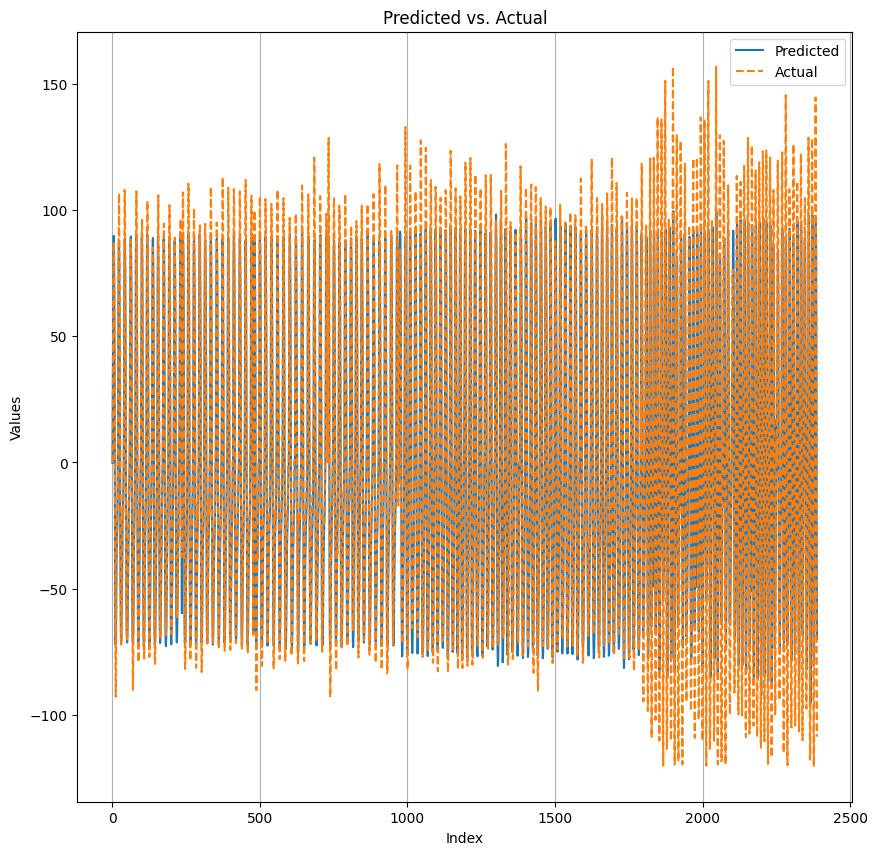

SCENE 1  TRAIN: [2024  415  621 ... 1115 1268 1293]  TEST: [2387 2388 2389 ... 4719 4720 4721]
Epoch 1/30
150/150 [==============================] - 8s 20ms/step - loss: 0.1578 - val_loss: 0.1627
Epoch 2/30
150/150 [==============================] - 3s 18ms/step - loss: 0.0998 - val_loss: 0.1083
Epoch 3/30
150/150 [==============================] - 3s 18ms/step - loss: 0.0818 - val_loss: 0.1048
Epoch 4/30
150/150 [==============================] - 2s 14ms/step - loss: 0.0804 - val_loss: 0.1046
Epoch 5/30
150/150 [==============================] - 2s 14ms/step - loss: 0.0631 - val_loss: 0.0685
Epoch 6/30
150/150 [==============================] - 2s 14ms/step - loss: 0.0628 - val_loss: 0.0766
Epoch 7/30
150/150 [==============================] - 2s 14ms/step - loss: 0.0547 - val_loss: 0.0686
Epoch 8/30
150/150 [==============================] - 2s 16ms/step - loss: 0.0588 - val_loss: 0.0745
Epoch 9/30
150/150 [==============================] - 3s 19ms/step - loss: 0.0554 - val_loss: 0.0

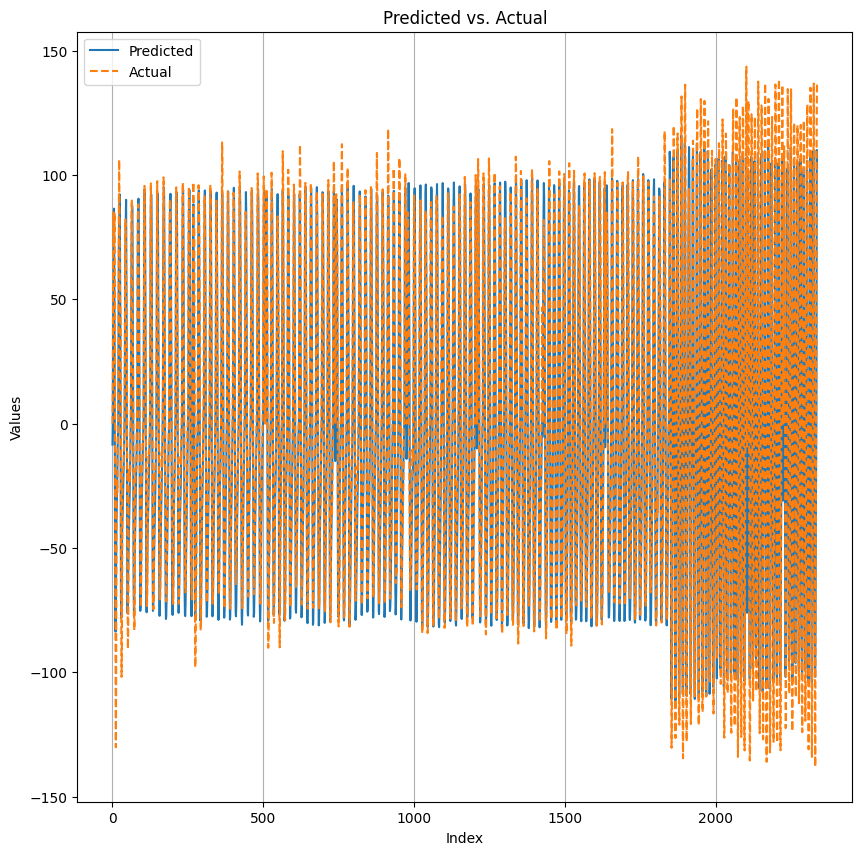

In [15]:
ResultadosRegressao(Resultados4Matrix[0],Resultados4Matrix[1],Resultados4Matrix[2])

# Exercicio 4 Cross Validation Utilizadores

SCENE 0  TRAIN: [3921 1480 1830 ... 1215 1936 2000]  TEST: [   0    1    2 ... 3358 3359 3360]
Epoch 1/30
174/174 [==============================] - 9s 19ms/step - loss: 0.1804 - val_loss: 0.1976
Epoch 2/30
174/174 [==============================] - 2s 12ms/step - loss: 0.1329 - val_loss: 0.1817
Epoch 3/30
174/174 [==============================] - 2s 12ms/step - loss: 0.1200 - val_loss: 0.1743
Epoch 4/30
174/174 [==============================] - 2s 12ms/step - loss: 0.1090 - val_loss: 0.1580
Epoch 5/30
174/174 [==============================] - 3s 17ms/step - loss: 0.1112 - val_loss: 0.1768
Epoch 6/30
174/174 [==============================] - 3s 14ms/step - loss: 0.0975 - val_loss: 0.1264
Epoch 7/30
174/174 [==============================] - 2s 12ms/step - loss: 0.0919 - val_loss: 0.1500
Epoch 8/30
174/174 [==============================] - 2s 12ms/step - loss: 0.0947 - val_loss: 0.1559
Epoch 9/30
174/174 [==============================] - 2s 12ms/step - loss: 0.0787 - val_loss: 0.1

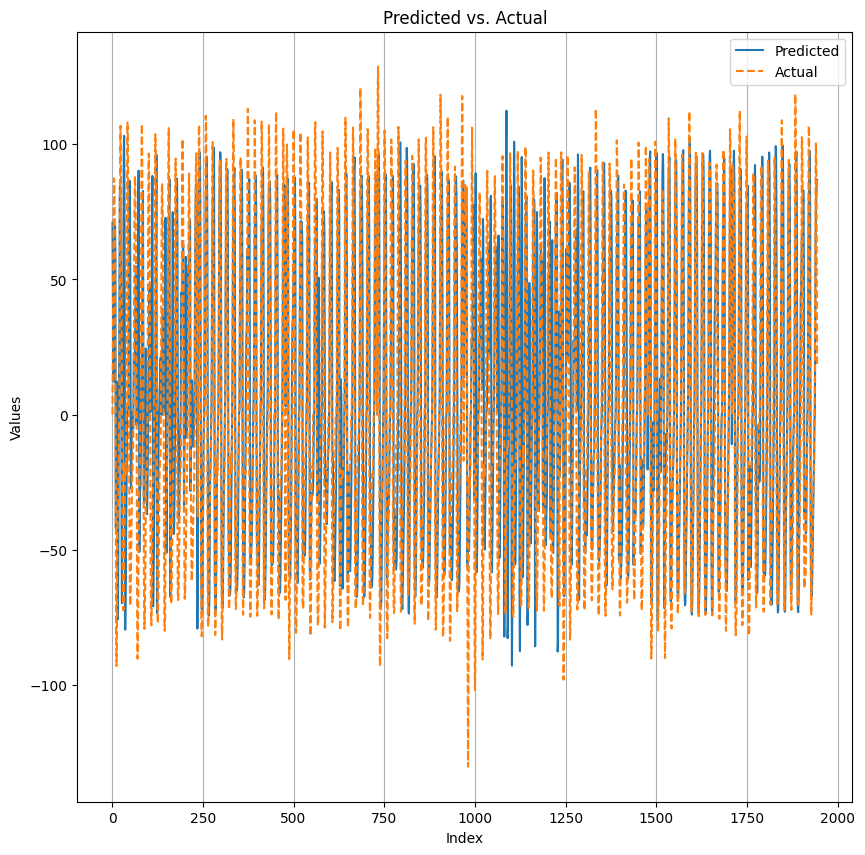

SCENE 1  TRAIN: [ 229  301 2806 ...  901 3128 3183]  TEST: [ 969  970  971 ... 4227 4228 4229]
Epoch 1/30
190/190 [==============================] - 9s 19ms/step - loss: 0.1666 - val_loss: 0.1633
Epoch 2/30
190/190 [==============================] - 3s 14ms/step - loss: 0.1324 - val_loss: 0.1722
Epoch 3/30
190/190 [==============================] - 3s 17ms/step - loss: 0.1249 - val_loss: 0.1372
Epoch 4/30
190/190 [==============================] - 3s 13ms/step - loss: 0.0911 - val_loss: 0.0590
Epoch 5/30
190/190 [==============================] - 3s 14ms/step - loss: 0.0712 - val_loss: 0.0701
Epoch 6/30
190/190 [==============================] - 3s 15ms/step - loss: 0.0574 - val_loss: 0.0490
Epoch 7/30
190/190 [==============================] - 4s 21ms/step - loss: 0.0542 - val_loss: 0.0479
Epoch 8/30
190/190 [==============================] - 3s 16ms/step - loss: 0.0537 - val_loss: 0.0761
Epoch 9/30
190/190 [==============================] - 2s 13ms/step - loss: 0.0478 - val_loss: 0.0

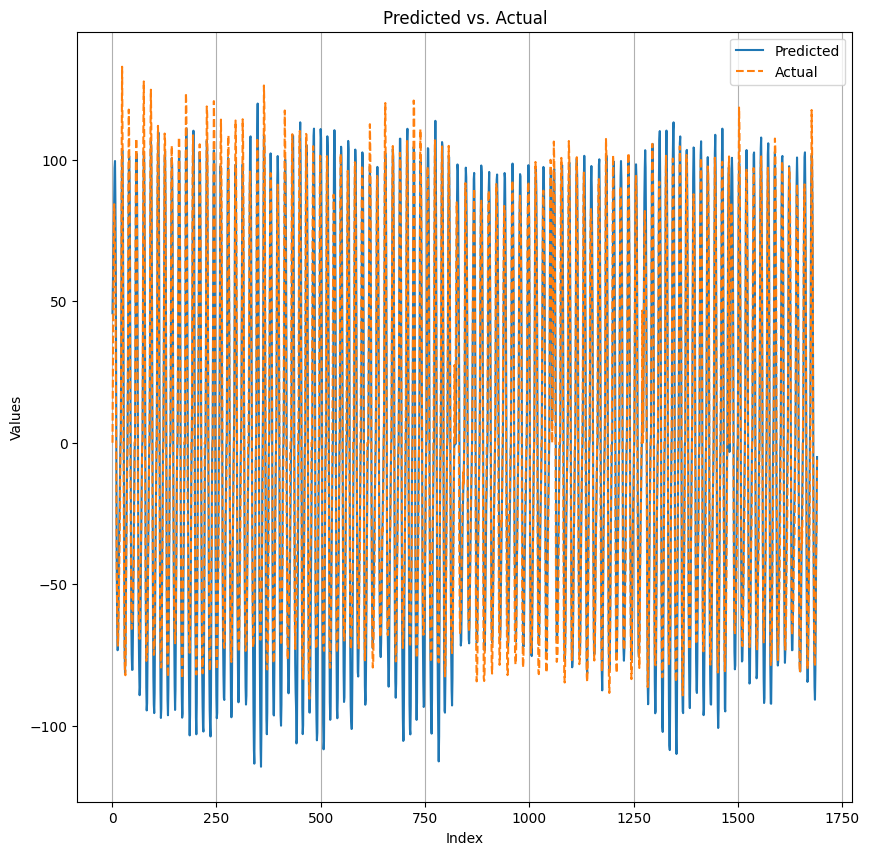

SCENE 2  TRAIN: [ 843 2590 2806 ... 1091 1425 3942]  TEST: [1790 1791 1792 ... 4719 4720 4721]
Epoch 1/30
228/228 [==============================] - 10s 21ms/step - loss: 0.1273 - val_loss: 0.3153
Epoch 2/30
228/228 [==============================] - 3s 13ms/step - loss: 0.0758 - val_loss: 0.2979
Epoch 3/30
228/228 [==============================] - 3s 13ms/step - loss: 0.0577 - val_loss: 0.3410
Epoch 4/30
228/228 [==============================] - 3s 12ms/step - loss: 0.0511 - val_loss: 0.3399
Epoch 5/30
228/228 [==============================] - 3s 15ms/step - loss: 0.0500 - val_loss: 0.2767
Epoch 6/30
228/228 [==============================] - 3s 15ms/step - loss: 0.0431 - val_loss: 0.1431
Epoch 7/30
228/228 [==============================] - 3s 12ms/step - loss: 0.0439 - val_loss: 0.2020
Epoch 8/30
228/228 [==============================] - 3s 12ms/step - loss: 0.0439 - val_loss: 0.2369
Epoch 9/30
228/228 [==============================] - 3s 12ms/step - loss: 0.0430 - val_loss: 0.

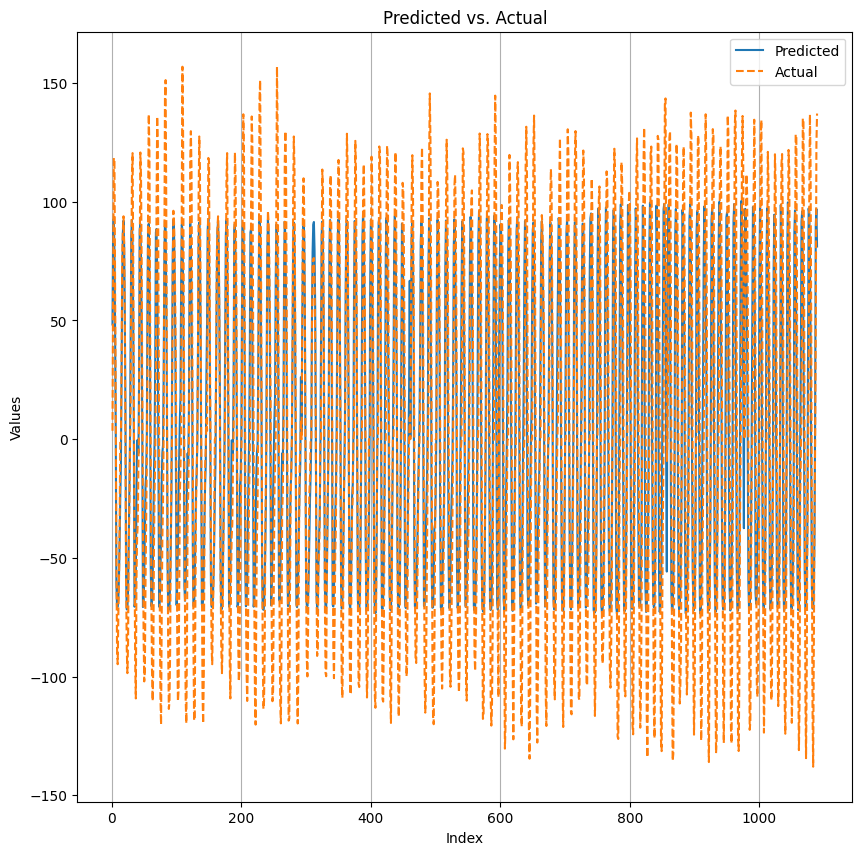

In [16]:
ResultadosRegressao(Resultados4Matrix[0],Resultados4Matrix[1],Resultados4Matrix[3])

# Exercicio 4 Cross Validation Repeticoes

SCENE 0  TRAIN: [1492 4378 3866 ... 1287 2794 1771]  TEST: [   0    1    2 ... 4367 4368 4369]
Epoch 1/30
219/219 [==============================] - 9s 15ms/step - loss: 0.1790 - val_loss: 0.1755
Epoch 2/30
219/219 [==============================] - 3s 15ms/step - loss: 0.1224 - val_loss: 0.0801
Epoch 3/30
219/219 [==============================] - 3s 12ms/step - loss: 0.0899 - val_loss: 0.0848
Epoch 4/30
219/219 [==============================] - 2s 11ms/step - loss: 0.0650 - val_loss: 0.0604
Epoch 5/30
219/219 [==============================] - 2s 11ms/step - loss: 0.0545 - val_loss: 0.0520
Epoch 6/30
219/219 [==============================] - 2s 11ms/step - loss: 0.0508 - val_loss: 0.0429
Epoch 7/30
219/219 [==============================] - 3s 14ms/step - loss: 0.0496 - val_loss: 0.0439
Epoch 8/30
219/219 [==============================] - 3s 13ms/step - loss: 0.0427 - val_loss: 0.0496
Epoch 9/30
219/219 [==============================] - 3s 12ms/step - loss: 0.0444 - val_loss: 0.0

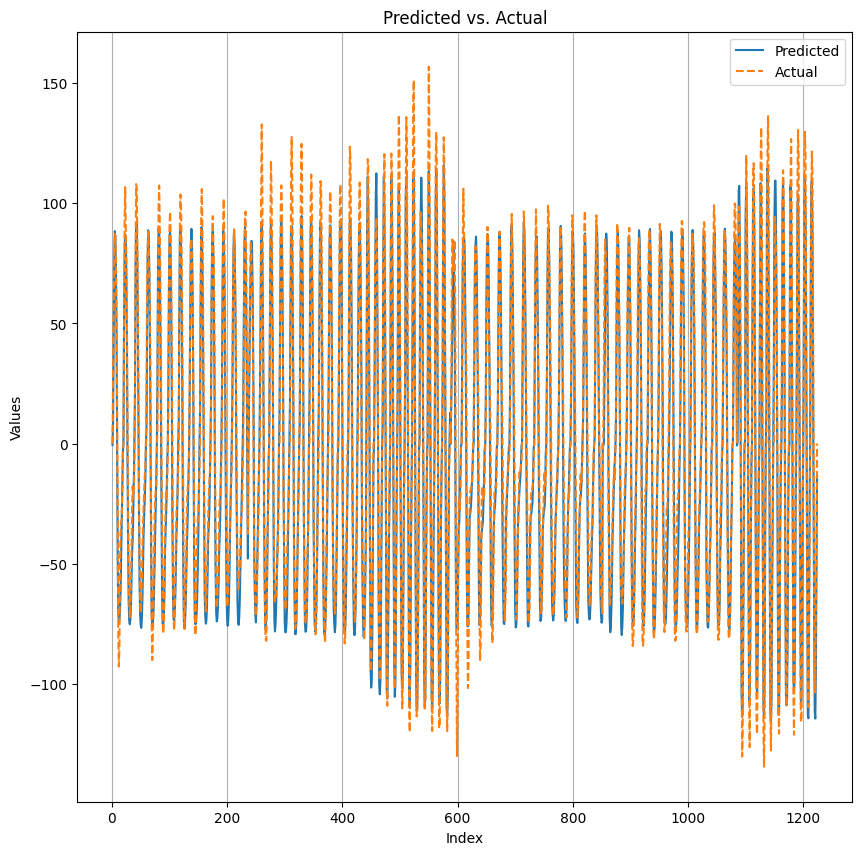

SCENE 1  TRAIN: [4683  597 1603 ... 4266 1399 2448]  TEST: [ 236  237  238 ... 4487 4488 4489]
Epoch 1/30
222/222 [==============================] - 9s 21ms/step - loss: 0.1819 - val_loss: 0.1572
Epoch 2/30
222/222 [==============================] - 3s 12ms/step - loss: 0.1225 - val_loss: 0.1072
Epoch 3/30
222/222 [==============================] - 3s 11ms/step - loss: 0.0928 - val_loss: 0.0819
Epoch 4/30
222/222 [==============================] - 3s 11ms/step - loss: 0.0722 - val_loss: 0.0719
Epoch 5/30
222/222 [==============================] - 3s 12ms/step - loss: 0.0592 - val_loss: 0.0543
Epoch 6/30
222/222 [==============================] - 4s 16ms/step - loss: 0.0520 - val_loss: 0.0407
Epoch 7/30
222/222 [==============================] - 3s 12ms/step - loss: 0.0500 - val_loss: 0.0566
Epoch 8/30
222/222 [==============================] - 3s 12ms/step - loss: 0.0470 - val_loss: 0.0388
Epoch 9/30
222/222 [==============================] - 3s 11ms/step - loss: 0.0440 - val_loss: 0.0

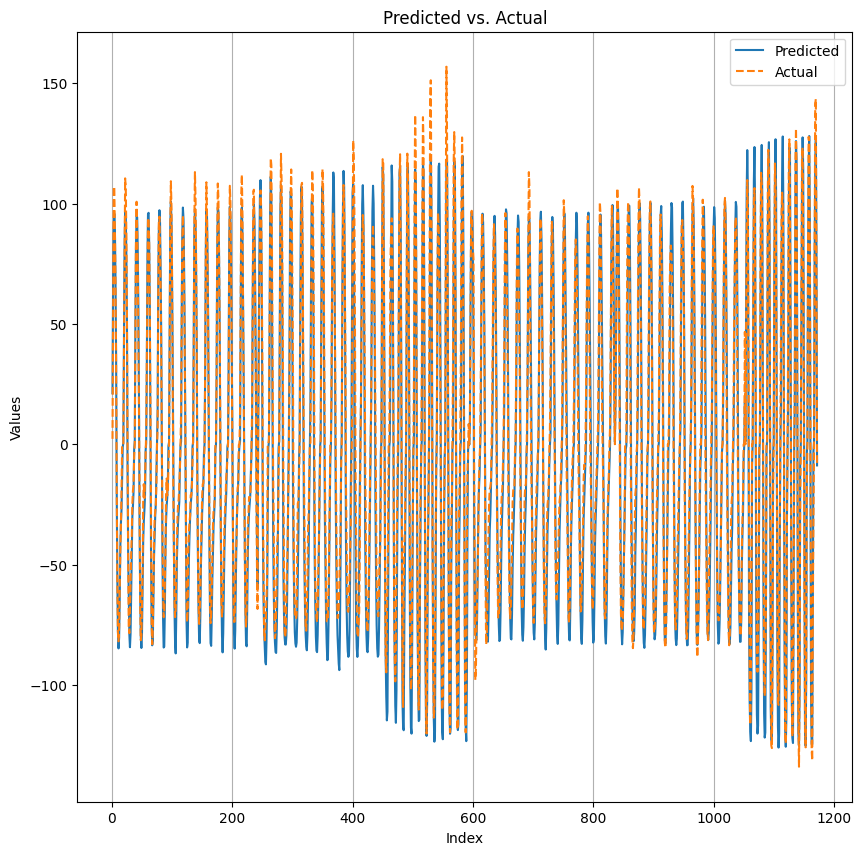

SCENE 2  TRAIN: [2018 1191 4344 ...  288 2426 2854]  TEST: [ 478  479  480 ... 4606 4607 4608]
Epoch 1/30
222/222 [==============================] - 9s 17ms/step - loss: 0.1376 - val_loss: 0.1167
Epoch 2/30
222/222 [==============================] - 3s 12ms/step - loss: 0.0719 - val_loss: 0.0629
Epoch 3/30
222/222 [==============================] - 3s 15ms/step - loss: 0.0616 - val_loss: 0.1010
Epoch 4/30
222/222 [==============================] - 3s 14ms/step - loss: 0.0523 - val_loss: 0.0551
Epoch 5/30
222/222 [==============================] - 3s 12ms/step - loss: 0.0485 - val_loss: 0.0453
Epoch 6/30
222/222 [==============================] - 3s 12ms/step - loss: 0.0501 - val_loss: 0.0453
Epoch 7/30
222/222 [==============================] - 3s 12ms/step - loss: 0.0457 - val_loss: 0.0450
Epoch 8/30
222/222 [==============================] - 3s 15ms/step - loss: 0.0452 - val_loss: 0.0452
Epoch 9/30
222/222 [==============================] - 3s 15ms/step - loss: 0.0435 - val_loss: 0.0

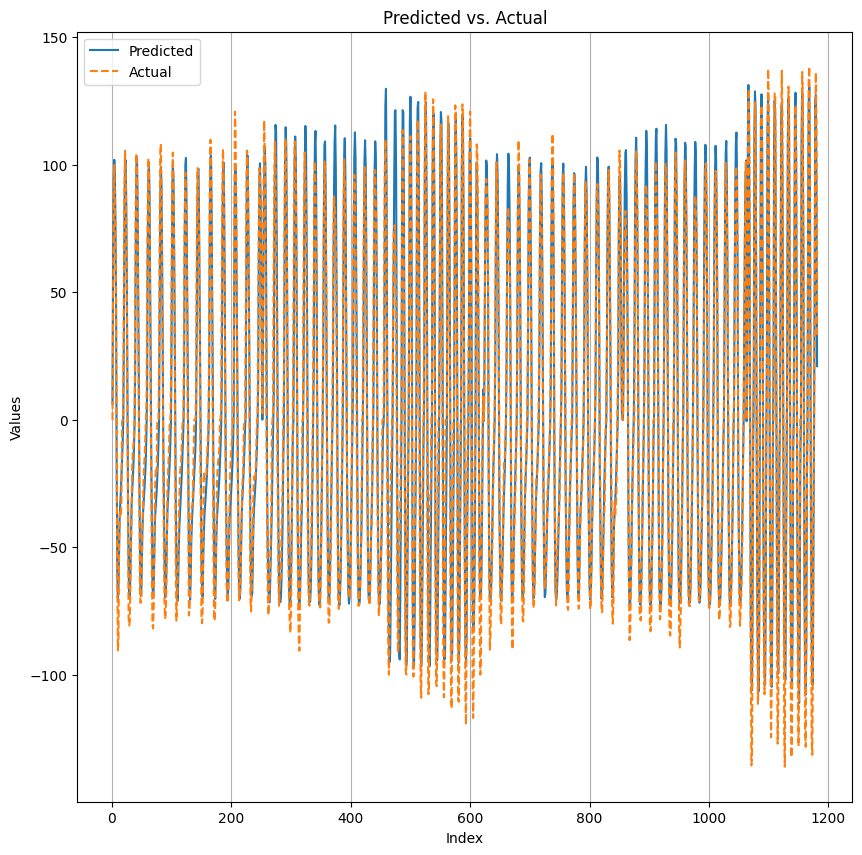

SCENE 3  TRAIN: [ 542  497 3819 ... 3761 1134 2757]  TEST: [ 729  730  731 ... 4719 4720 4721]
Epoch 1/30
224/224 [==============================] - 10s 17ms/step - loss: 0.1705 - val_loss: 0.1235
Epoch 2/30
224/224 [==============================] - 3s 12ms/step - loss: 0.1125 - val_loss: 0.0865
Epoch 3/30
224/224 [==============================] - 3s 13ms/step - loss: 0.0760 - val_loss: 0.0567
Epoch 4/30
224/224 [==============================] - 4s 16ms/step - loss: 0.0622 - val_loss: 0.0651
Epoch 5/30
224/224 [==============================] - 3s 13ms/step - loss: 0.0594 - val_loss: 0.0448
Epoch 6/30
224/224 [==============================] - 3s 13ms/step - loss: 0.0496 - val_loss: 0.0616
Epoch 7/30
224/224 [==============================] - 3s 12ms/step - loss: 0.0508 - val_loss: 0.0438
Epoch 8/30
224/224 [==============================] - 3s 12ms/step - loss: 0.0471 - val_loss: 0.0415
Epoch 9/30
224/224 [==============================] - 3s 15ms/step - loss: 0.0450 - val_loss: 0.

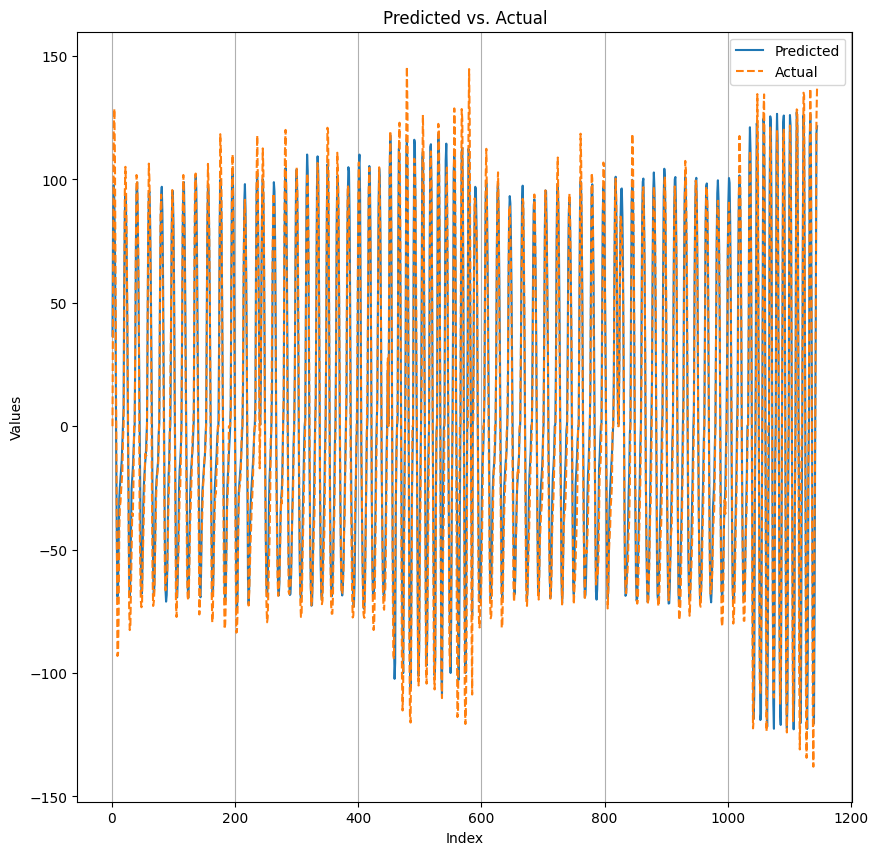

In [17]:
ResultadosRegressao(Resultados4Matrix[0],Resultados4Matrix[1],Resultados4Matrix[4])

# Exercicio 4 Cross Validation Scenes

SCENE 0  TRAIN: [2266 2647 4628 ...  901 2605  748]  TEST: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 

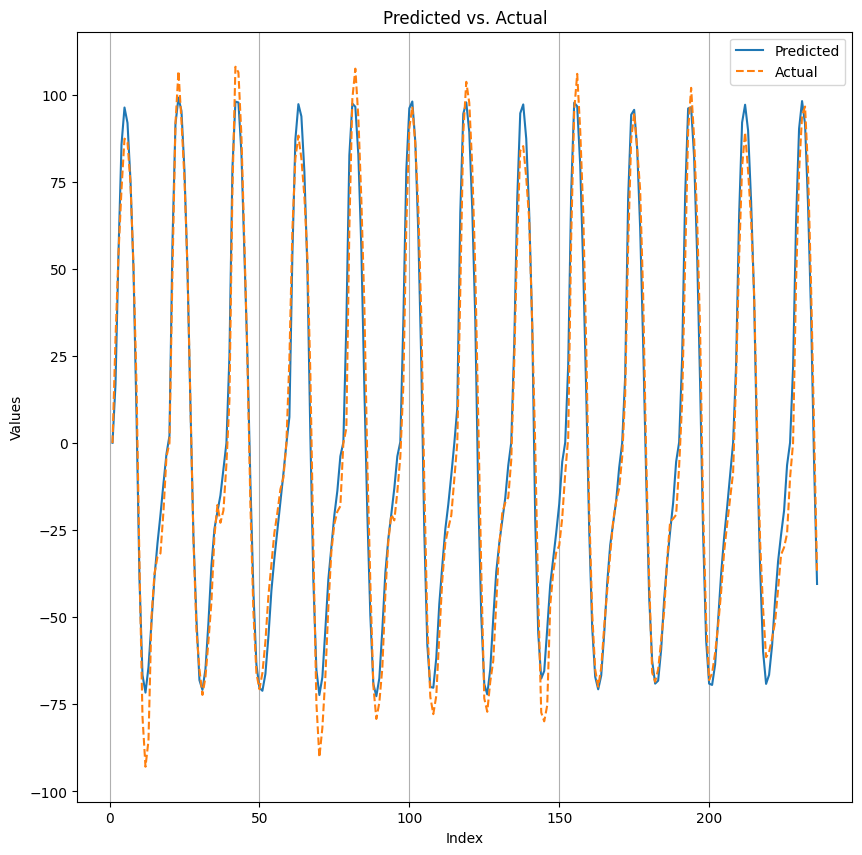

SCENE 1  TRAIN: [4542 3706  619 ... 1418 4377 3547]  TEST: [236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253
 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271
 272 273 274 275 276 277 278 279 280 281 282 283 284 285 286 287 288 289
 290 291 292 293 294 295 296 297 298 299 300 301 302 303 304 305 306 307
 308 309 310 311 312 313 314 315 316 317 318 319 320 321 322 323 324 325
 326 327 328 329 330 331 332 333 334 335 336 337 338 339 340 341 342 343
 344 345 346 347 348 349 350 351 352 353 354 355 356 357 358 359 360 361
 362 363 364 365 366 367 368 369 370 371 372 373 374 375 376 377 378 379
 380 381 382 383 384 385 386 387 388 389 390 391 392 393 394 395 396 397
 398 399 400 401 402 403 404 405 406 407 408 409 410 411 412 413 414 415
 416 417 418 419 420 421 422 423 424 425 426 427 428 429 430 431 432 433
 434 435 436 437 438 439 440 441 442 443 444 445 446 447 448 449 450 451
 452 453 454 455 456 457 458 459 460 461 462 463 464 465 466 467 

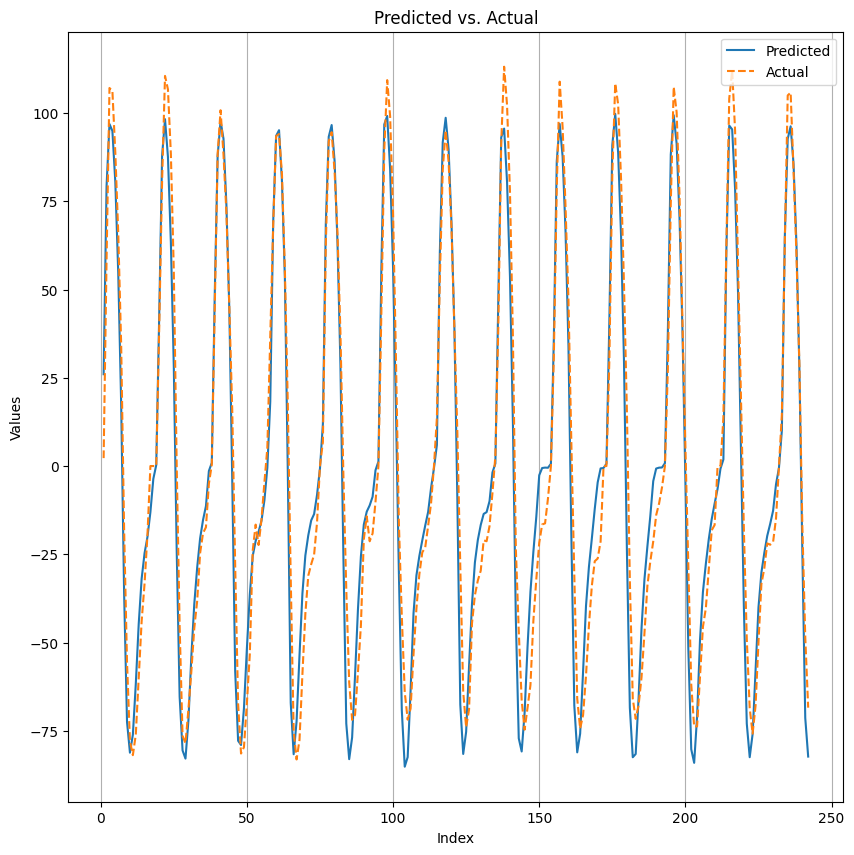

SCENE 2  TRAIN: [ 262 4543 3515 ... 2798 2120 2054]  TEST: [478 479 480 481 482 483 484 485 486 487 488 489 490 491 492 493 494 495
 496 497 498 499 500 501 502 503 504 505 506 507 508 509 510 511 512 513
 514 515 516 517 518 519 520 521 522 523 524 525 526 527 528 529 530 531
 532 533 534 535 536 537 538 539 540 541 542 543 544 545 546 547 548 549
 550 551 552 553 554 555 556 557 558 559 560 561 562 563 564 565 566 567
 568 569 570 571 572 573 574 575 576 577 578 579 580 581 582 583 584 585
 586 587 588 589 590 591 592 593 594 595 596 597 598 599 600 601 602 603
 604 605 606 607 608 609 610 611 612 613 614 615 616 617 618 619 620 621
 622 623 624 625 626 627 628 629 630 631 632 633 634 635 636 637 638 639
 640 641 642 643 644 645 646 647 648 649 650 651 652 653 654 655 656 657
 658 659 660 661 662 663 664 665 666 667 668 669 670 671 672 673 674 675
 676 677 678 679 680 681 682 683 684 685 686 687 688 689 690 691 692 693
 694 695 696 697 698 699 700 701 702 703 704 705 706 707 708 709 

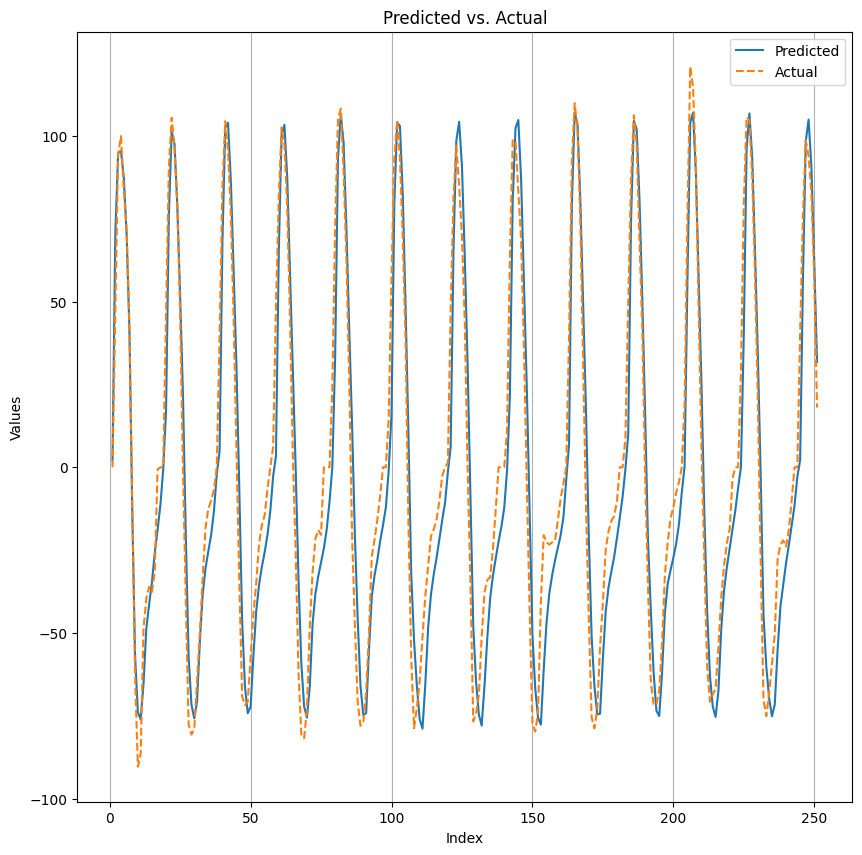

SCENE 3  TRAIN: [4469  128 2210 ... 1679 3942 1328]  TEST: [729 730 731 732 733 734 735 736 737 738 739 740 741 742 743 744 745 746
 747 748 749 750 751 752 753 754 755 756 757 758 759 760 761 762 763 764
 765 766 767 768 769 770 771 772 773 774 775 776 777 778 779 780 781 782
 783 784 785 786 787 788 789 790 791 792 793 794 795 796 797 798 799 800
 801 802 803 804 805 806 807 808 809 810 811 812 813 814 815 816 817 818
 819 820 821 822 823 824 825 826 827 828 829 830 831 832 833 834 835 836
 837 838 839 840 841 842 843 844 845 846 847 848 849 850 851 852 853 854
 855 856 857 858 859 860 861 862 863 864 865 866 867 868 869 870 871 872
 873 874 875 876 877 878 879 880 881 882 883 884 885 886 887 888 889 890
 891 892 893 894 895 896 897 898 899 900 901 902 903 904 905 906 907 908
 909 910 911 912 913 914 915 916 917 918 919 920 921 922 923 924 925 926
 927 928 929 930 931 932 933 934 935 936 937 938 939 940 941 942 943 944
 945 946 947 948 949 950 951 952 953 954 955 956 957 958 959 960 

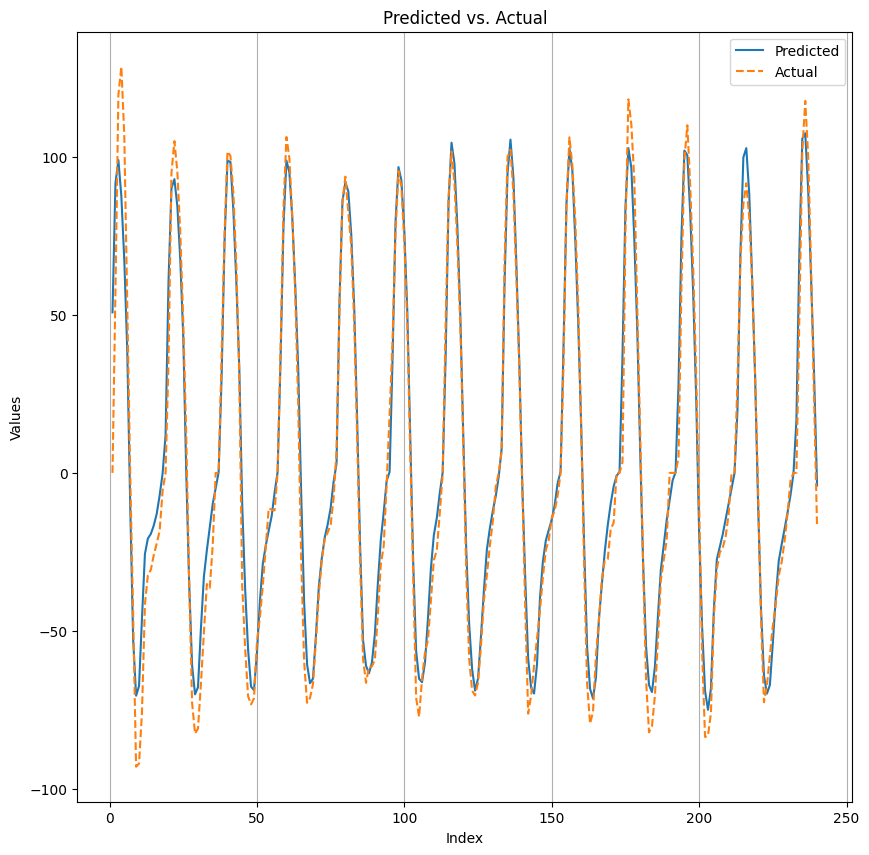

SCENE 4  TRAIN: [ 101 2657 2691 ... 2824 3800 3136]  TEST: [ 969  970  971  972  973  974  975  976  977  978  979  980  981  982
  983  984  985  986  987  988  989  990  991  992  993  994  995  996
  997  998  999 1000 1001 1002 1003 1004 1005 1006 1007 1008 1009 1010
 1011 1012 1013 1014 1015 1016 1017 1018 1019 1020 1021 1022 1023 1024
 1025 1026 1027 1028 1029 1030 1031 1032 1033 1034 1035 1036 1037 1038
 1039 1040 1041 1042 1043 1044 1045 1046 1047 1048 1049 1050 1051 1052
 1053 1054 1055 1056 1057 1058 1059 1060 1061 1062 1063 1064 1065 1066
 1067 1068 1069 1070 1071 1072 1073 1074 1075 1076 1077 1078 1079 1080
 1081 1082 1083 1084 1085 1086 1087 1088 1089 1090 1091 1092 1093 1094
 1095 1096 1097 1098 1099 1100 1101 1102 1103 1104 1105 1106 1107 1108
 1109 1110 1111 1112 1113 1114 1115 1116 1117 1118 1119 1120 1121 1122
 1123 1124 1125 1126 1127 1128 1129 1130 1131 1132 1133 1134 1135 1136
 1137 1138 1139 1140 1141 1142 1143 1144 1145 1146 1147 1148 1149 1150
 1151 1152 1153 11

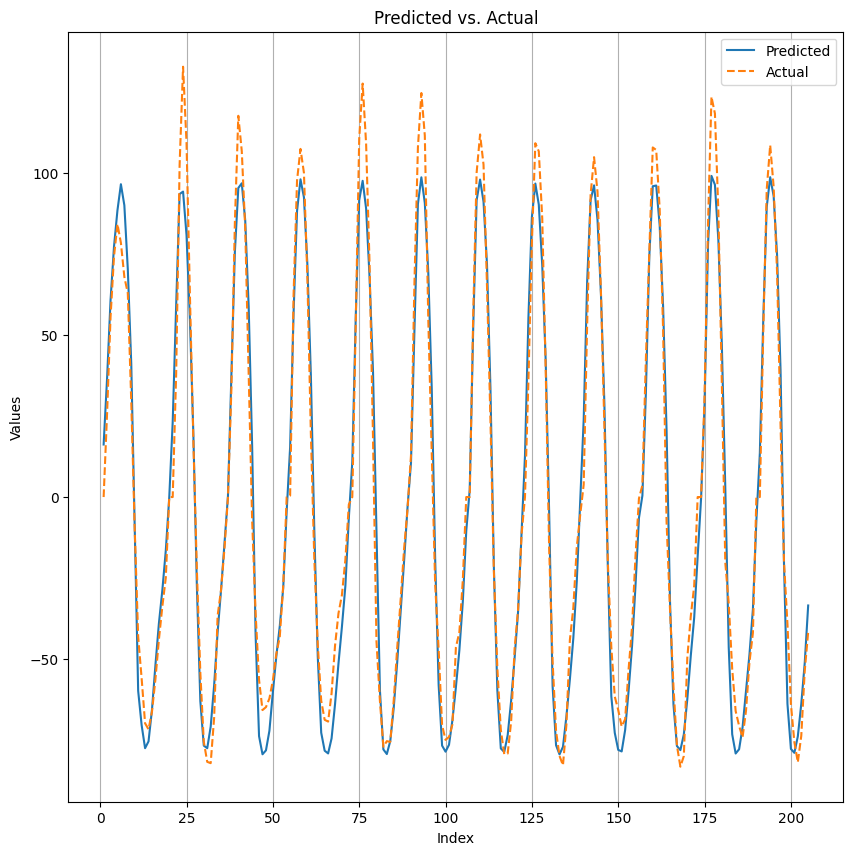

SCENE 5  TRAIN: [ 371 4214 1988 ... 4665 1107   53]  TEST: [1174 1175 1176 1177 1178 1179 1180 1181 1182 1183 1184 1185 1186 1187
 1188 1189 1190 1191 1192 1193 1194 1195 1196 1197 1198 1199 1200 1201
 1202 1203 1204 1205 1206 1207 1208 1209 1210 1211 1212 1213 1214 1215
 1216 1217 1218 1219 1220 1221 1222 1223 1224 1225 1226 1227 1228 1229
 1230 1231 1232 1233 1234 1235 1236 1237 1238 1239 1240 1241 1242 1243
 1244 1245 1246 1247 1248 1249 1250 1251 1252 1253 1254 1255 1256 1257
 1258 1259 1260 1261 1262 1263 1264 1265 1266 1267 1268 1269 1270 1271
 1272 1273 1274 1275 1276 1277 1278 1279 1280 1281 1282 1283 1284 1285
 1286 1287 1288 1289 1290 1291 1292 1293 1294 1295 1296 1297 1298 1299
 1300 1301 1302 1303 1304 1305 1306 1307 1308 1309 1310 1311 1312 1313
 1314 1315 1316 1317 1318 1319 1320 1321 1322 1323 1324 1325 1326 1327
 1328 1329 1330 1331 1332 1333 1334 1335 1336 1337 1338 1339 1340 1341
 1342 1343 1344 1345 1346 1347 1348 1349 1350 1351 1352 1353 1354 1355
 1356 1357 1358 13

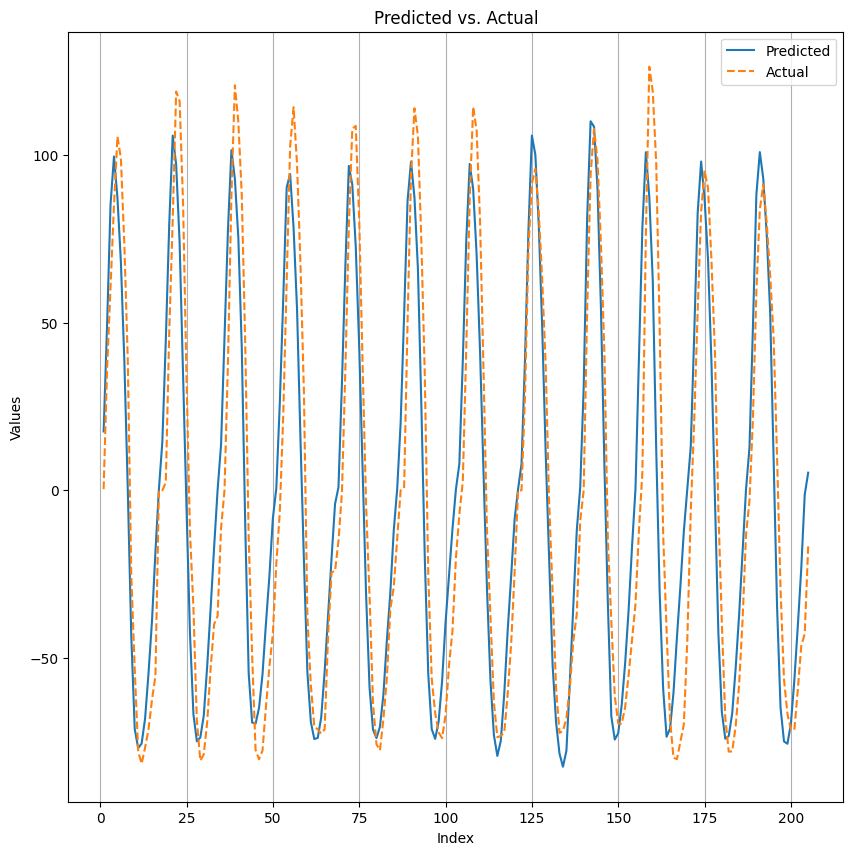

SCENE 6  TRAIN: [1071 3658 3322 ... 3489 3104 1702]  TEST: [1379 1380 1381 1382 1383 1384 1385 1386 1387 1388 1389 1390 1391 1392
 1393 1394 1395 1396 1397 1398 1399 1400 1401 1402 1403 1404 1405 1406
 1407 1408 1409 1410 1411 1412 1413 1414 1415 1416 1417 1418 1419 1420
 1421 1422 1423 1424 1425 1426 1427 1428 1429 1430 1431 1432 1433 1434
 1435 1436 1437 1438 1439 1440 1441 1442 1443 1444 1445 1446 1447 1448
 1449 1450 1451 1452 1453 1454 1455 1456 1457 1458 1459 1460 1461 1462
 1463 1464 1465 1466 1467 1468 1469 1470 1471 1472 1473 1474 1475 1476
 1477 1478 1479 1480 1481 1482 1483 1484 1485 1486 1487 1488 1489 1490
 1491 1492 1493 1494 1495 1496 1497 1498 1499 1500 1501 1502 1503 1504
 1505 1506 1507 1508 1509 1510 1511 1512 1513 1514 1515 1516 1517 1518
 1519 1520 1521 1522 1523 1524 1525 1526 1527 1528 1529 1530 1531 1532
 1533 1534 1535 1536 1537 1538 1539 1540 1541 1542 1543 1544 1545 1546
 1547 1548 1549 1550 1551 1552 1553 1554 1555 1556 1557 1558 1559 1560
 1561 1562 1563 15

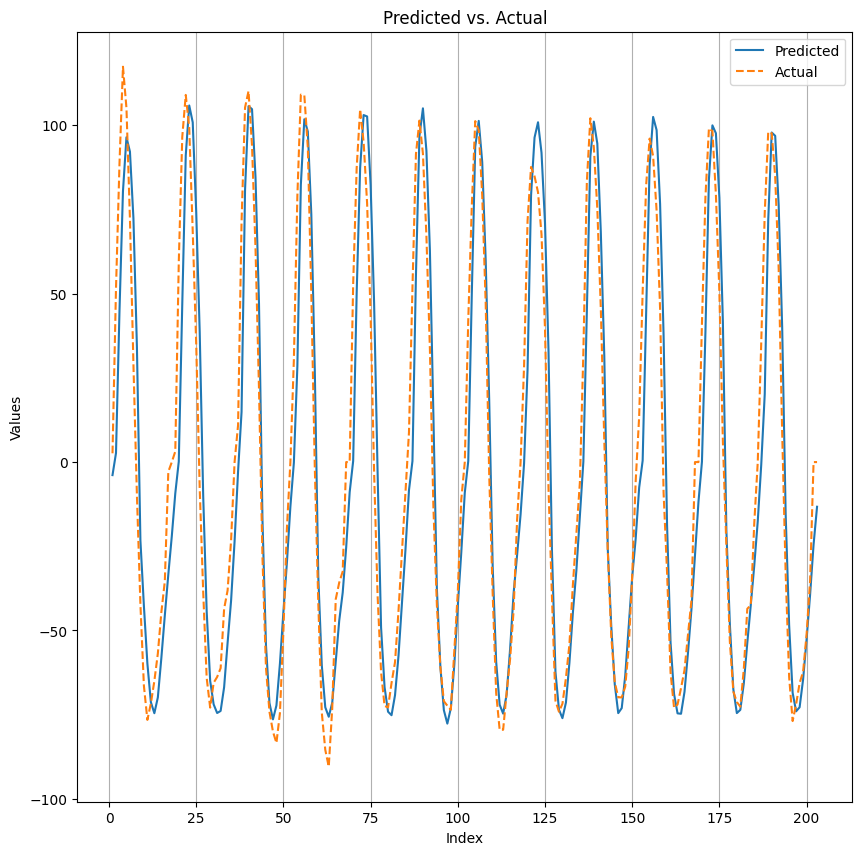

SCENE 7  TRAIN: [2478  517 3709 ... 4050 2874 3440]  TEST: [1582 1583 1584 1585 1586 1587 1588 1589 1590 1591 1592 1593 1594 1595
 1596 1597 1598 1599 1600 1601 1602 1603 1604 1605 1606 1607 1608 1609
 1610 1611 1612 1613 1614 1615 1616 1617 1618 1619 1620 1621 1622 1623
 1624 1625 1626 1627 1628 1629 1630 1631 1632 1633 1634 1635 1636 1637
 1638 1639 1640 1641 1642 1643 1644 1645 1646 1647 1648 1649 1650 1651
 1652 1653 1654 1655 1656 1657 1658 1659 1660 1661 1662 1663 1664 1665
 1666 1667 1668 1669 1670 1671 1672 1673 1674 1675 1676 1677 1678 1679
 1680 1681 1682 1683 1684 1685 1686 1687 1688 1689 1690 1691 1692 1693
 1694 1695 1696 1697 1698 1699 1700 1701 1702 1703 1704 1705 1706 1707
 1708 1709 1710 1711 1712 1713 1714 1715 1716 1717 1718 1719 1720 1721
 1722 1723 1724 1725 1726 1727 1728 1729 1730 1731 1732 1733 1734 1735
 1736 1737 1738 1739 1740 1741 1742 1743 1744 1745 1746 1747 1748 1749
 1750 1751 1752 1753 1754 1755 1756 1757 1758 1759 1760 1761 1762 1763
 1764 1765 1766 17

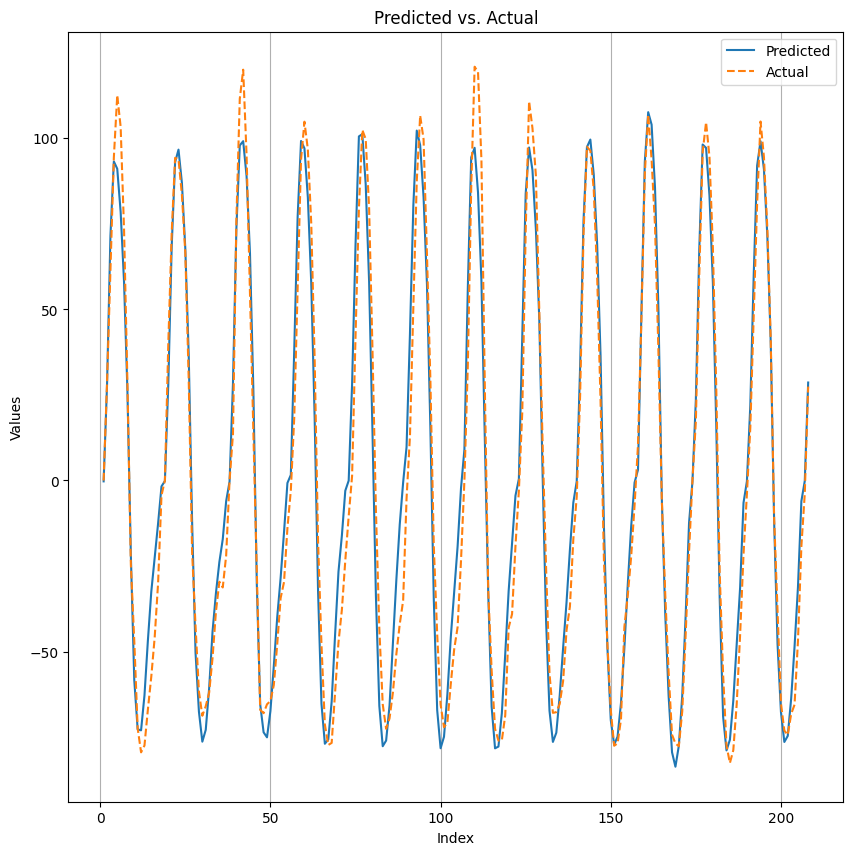

SCENE 8  TRAIN: [ 168 4263  906 ...  948 3245 3488]  TEST: [1790 1791 1792 1793 1794 1795 1796 1797 1798 1799 1800 1801 1802 1803
 1804 1805 1806 1807 1808 1809 1810 1811 1812 1813 1814 1815 1816 1817
 1818 1819 1820 1821 1822 1823 1824 1825 1826 1827 1828 1829 1830 1831
 1832 1833 1834 1835 1836 1837 1838 1839 1840 1841 1842 1843 1844 1845
 1846 1847 1848 1849 1850 1851 1852 1853 1854 1855 1856 1857 1858 1859
 1860 1861 1862 1863 1864 1865 1866 1867 1868 1869 1870 1871 1872 1873
 1874 1875 1876 1877 1878 1879 1880 1881 1882 1883 1884 1885 1886 1887
 1888 1889 1890 1891 1892 1893 1894 1895 1896 1897 1898 1899 1900 1901
 1902 1903 1904 1905 1906 1907 1908 1909 1910 1911 1912 1913 1914 1915
 1916 1917 1918 1919 1920 1921 1922 1923 1924 1925 1926 1927 1928 1929
 1930 1931 1932 1933 1934 1935]
Epoch 1/30
286/286 [==============================] - 9s 13ms/step - loss: 0.1412 - val_loss: 0.1563
Epoch 2/30
286/286 [==============================] - 4s 13ms/step - loss: 0.0858 - val_loss: 0.09

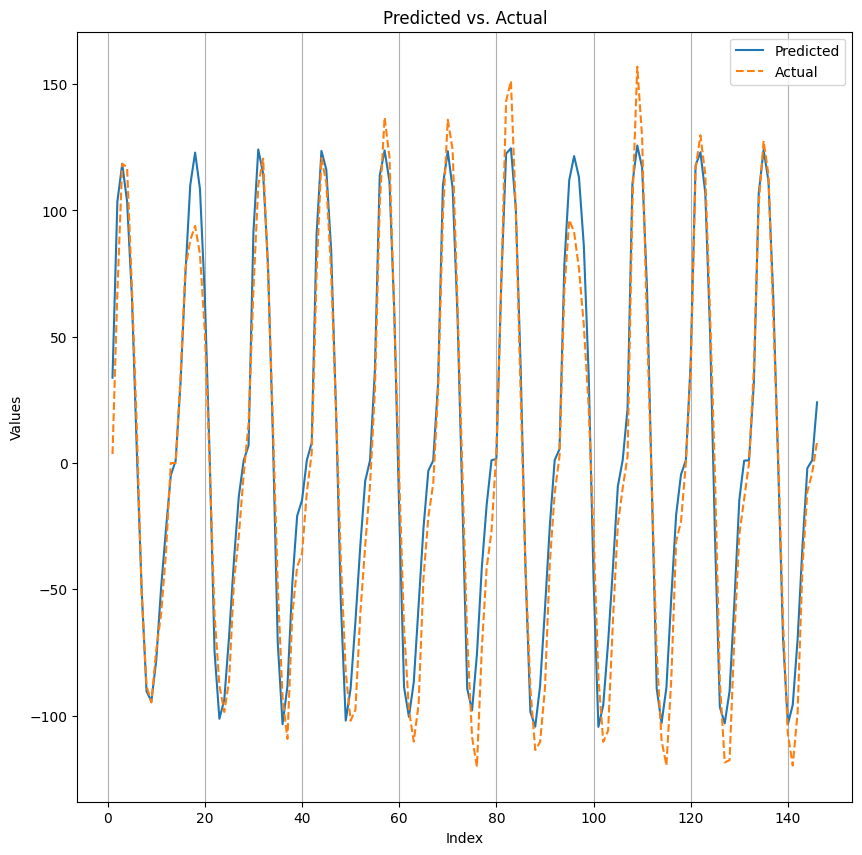

SCENE 9  TRAIN: [1027  804 1066 ... 3837 3774 4721]  TEST: [1936 1937 1938 1939 1940 1941 1942 1943 1944 1945 1946 1947 1948 1949
 1950 1951 1952 1953 1954 1955 1956 1957 1958 1959 1960 1961 1962 1963
 1964 1965 1966 1967 1968 1969 1970 1971 1972 1973 1974 1975 1976 1977
 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991
 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005
 2006 2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019
 2020 2021 2022 2023 2024 2025 2026 2027 2028 2029 2030 2031 2032 2033
 2034 2035 2036 2037 2038 2039 2040 2041 2042 2043 2044 2045 2046 2047
 2048 2049 2050 2051 2052 2053 2054 2055 2056 2057 2058 2059 2060 2061
 2062 2063 2064 2065 2066 2067 2068 2069 2070 2071 2072 2073 2074 2075
 2076 2077 2078 2079 2080 2081]
Epoch 1/30
286/286 [==============================] - 9s 13ms/step - loss: 0.1413 - val_loss: 0.0966
Epoch 2/30
286/286 [==============================] - 3s 11ms/step - loss: 0.0816 - val_loss: 0.08

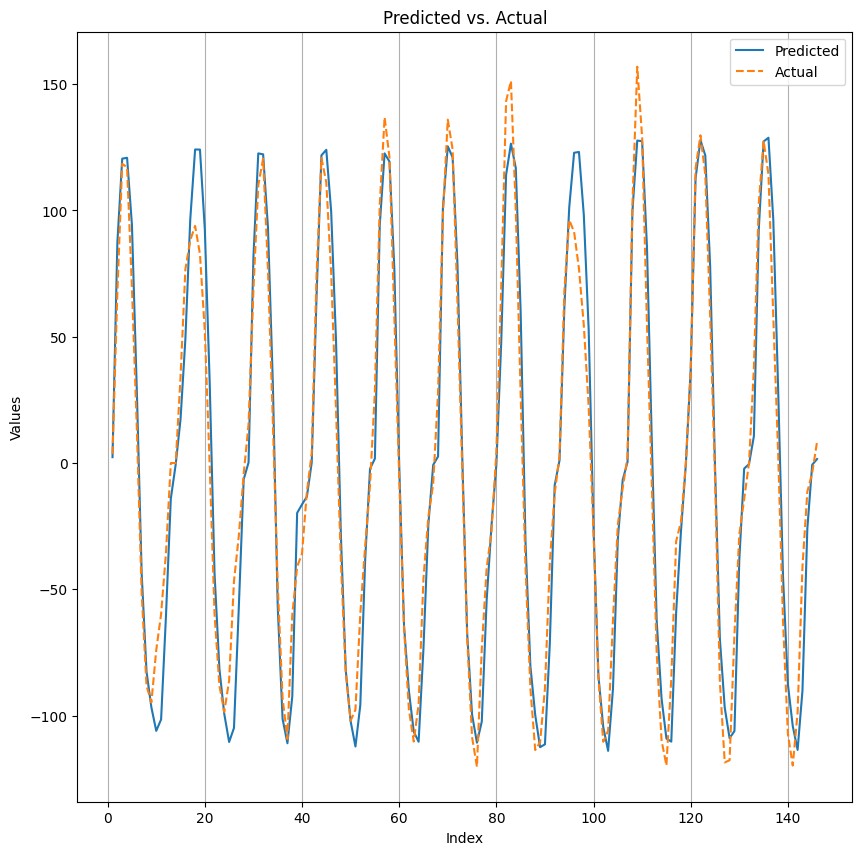

SCENE 10  TRAIN: [ 977  971 2744 ...  163 3840  173]  TEST: [2082 2083 2084 2085 2086 2087 2088 2089 2090 2091 2092 2093 2094 2095
 2096 2097 2098 2099 2100 2101 2102 2103 2104 2105 2106 2107 2108 2109
 2110 2111 2112 2113 2114 2115 2116 2117 2118 2119 2120 2121 2122 2123
 2124 2125 2126 2127 2128 2129 2130 2131 2132 2133 2134 2135 2136 2137
 2138 2139 2140 2141 2142 2143 2144 2145 2146 2147 2148 2149 2150 2151
 2152 2153 2154 2155 2156 2157 2158 2159 2160 2161 2162 2163 2164 2165
 2166 2167 2168 2169 2170 2171 2172 2173 2174 2175 2176 2177 2178 2179
 2180 2181 2182 2183 2184 2185 2186 2187 2188 2189 2190 2191 2192 2193
 2194 2195 2196 2197 2198 2199 2200 2201 2202 2203 2204 2205 2206 2207
 2208 2209 2210 2211 2212 2213 2214 2215 2216 2217 2218 2219 2220 2221
 2222 2223 2224 2225 2226 2227 2228 2229 2230 2231 2232 2233 2234 2235
 2236 2237 2238 2239 2240 2241 2242 2243 2244 2245 2246 2247 2248 2249]
Epoch 1/30
285/285 [==============================] - 13s 19ms/step - loss: 0.1642 - va

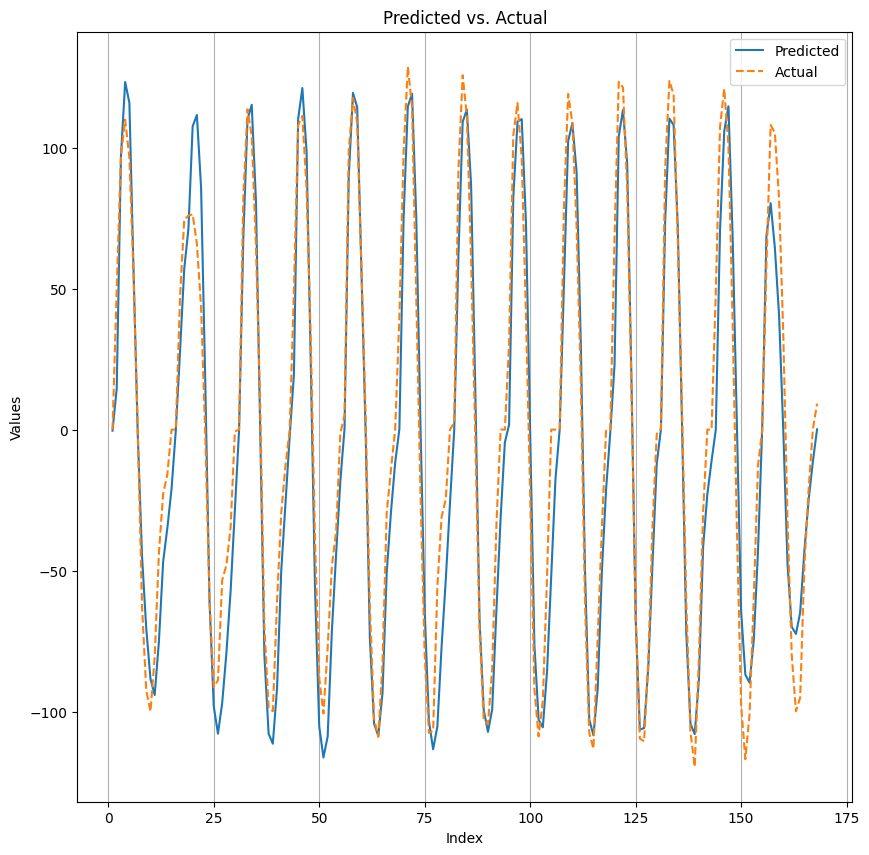

SCENE 11  TRAIN: [3231  251 2964 ...  141 2438 2710]  TEST: [2250 2251 2252 2253 2254 2255 2256 2257 2258 2259 2260 2261 2262 2263
 2264 2265 2266 2267 2268 2269 2270 2271 2272 2273 2274 2275 2276 2277
 2278 2279 2280 2281 2282 2283 2284 2285 2286 2287 2288 2289 2290 2291
 2292 2293 2294 2295 2296 2297 2298 2299 2300 2301 2302 2303 2304 2305
 2306 2307 2308 2309 2310 2311 2312 2313 2314 2315 2316 2317 2318 2319
 2320 2321 2322 2323 2324 2325 2326 2327 2328 2329 2330 2331 2332 2333
 2334 2335 2336 2337 2338 2339 2340 2341 2342 2343 2344 2345 2346 2347
 2348 2349 2350 2351 2352 2353 2354 2355 2356 2357 2358 2359 2360 2361
 2362 2363 2364 2365 2366 2367 2368 2369 2370 2371 2372 2373 2374 2375
 2376 2377 2378 2379 2380 2381 2382 2383 2384 2385 2386]
Epoch 1/30
287/287 [==============================] - 9s 17ms/step - loss: 0.1741 - val_loss: 0.2470
Epoch 2/30
287/287 [==============================] - 5s 17ms/step - loss: 0.1194 - val_loss: 0.1048
Epoch 3/30
287/287 [======================

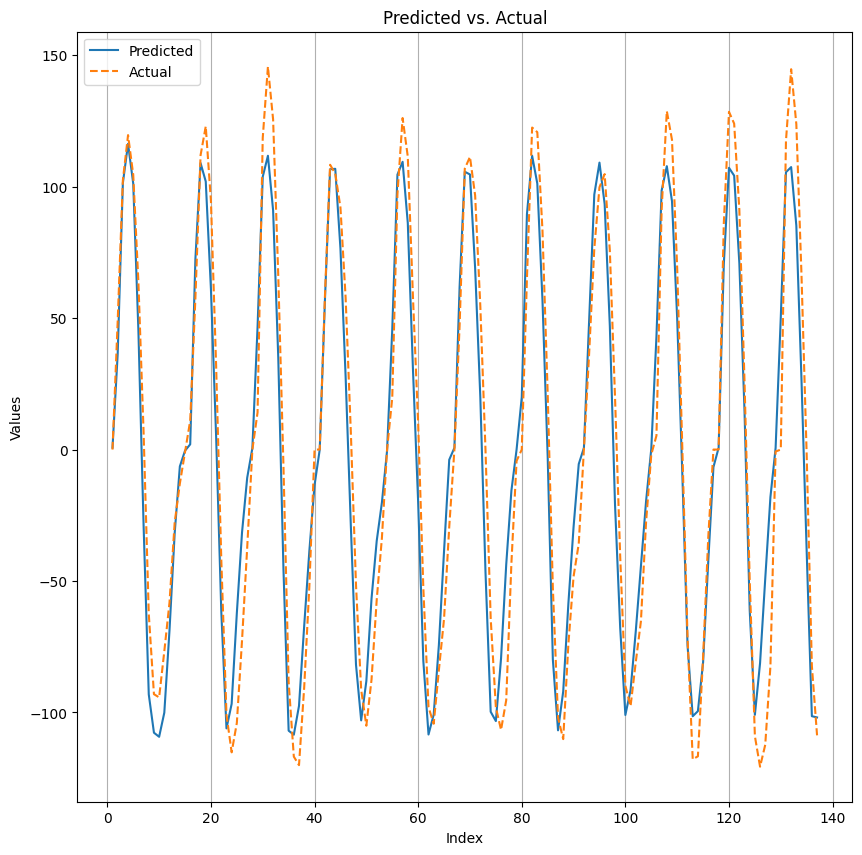

SCENE 12  TRAIN: [1257 2314 1424 ... 1913 3279 3132]  TEST: [2387 2388 2389 2390 2391 2392 2393 2394 2395 2396 2397 2398 2399 2400
 2401 2402 2403 2404 2405 2406 2407 2408 2409 2410 2411 2412 2413 2414
 2415 2416 2417 2418 2419 2420 2421 2422 2423 2424 2425 2426 2427 2428
 2429 2430 2431 2432 2433 2434 2435 2436 2437 2438 2439 2440 2441 2442
 2443 2444 2445 2446 2447 2448 2449 2450 2451 2452 2453 2454 2455 2456
 2457 2458 2459 2460 2461 2462 2463 2464 2465 2466 2467 2468 2469 2470
 2471 2472 2473 2474 2475 2476 2477 2478 2479 2480 2481 2482 2483 2484
 2485 2486 2487 2488 2489 2490 2491 2492 2493 2494 2495 2496 2497 2498
 2499 2500 2501 2502 2503 2504 2505 2506 2507 2508 2509 2510 2511 2512
 2513 2514 2515 2516 2517 2518 2519 2520 2521 2522 2523 2524 2525 2526
 2527 2528 2529 2530 2531 2532 2533 2534 2535 2536 2537 2538 2539 2540
 2541 2542 2543 2544 2545 2546 2547 2548 2549 2550 2551 2552 2553 2554
 2555 2556 2557 2558 2559 2560 2561 2562 2563 2564 2565 2566 2567 2568
 2569 2570 2571 2

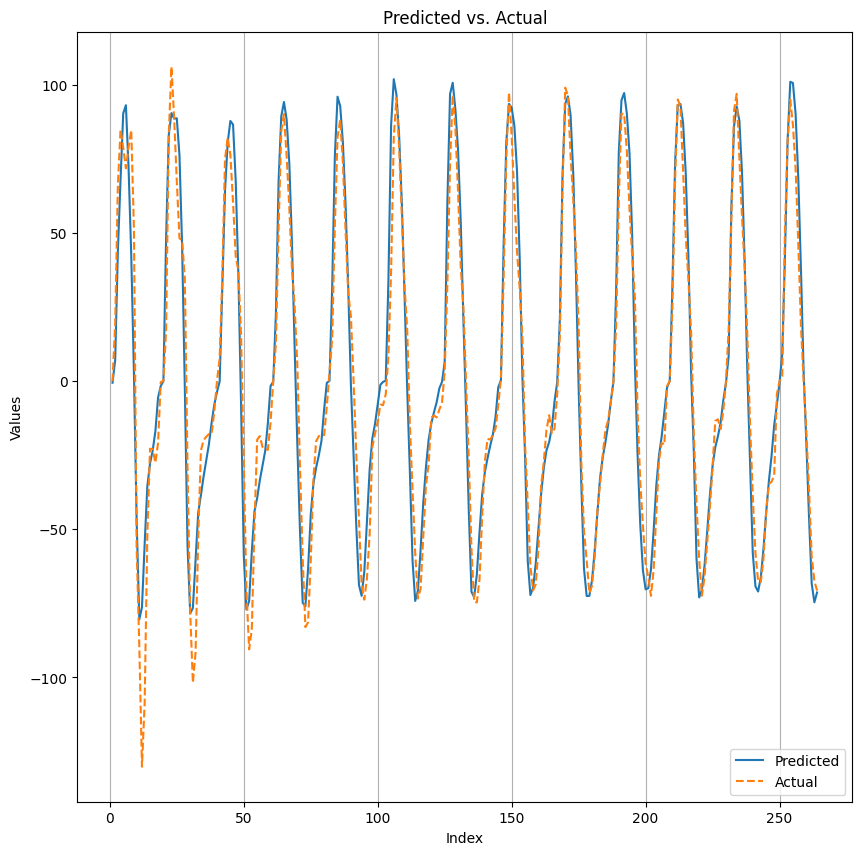

SCENE 13  TRAIN: [2472 1571  822 ... 4044  889 1937]  TEST: [2651 2652 2653 2654 2655 2656 2657 2658 2659 2660 2661 2662 2663 2664
 2665 2666 2667 2668 2669 2670 2671 2672 2673 2674 2675 2676 2677 2678
 2679 2680 2681 2682 2683 2684 2685 2686 2687 2688 2689 2690 2691 2692
 2693 2694 2695 2696 2697 2698 2699 2700 2701 2702 2703 2704 2705 2706
 2707 2708 2709 2710 2711 2712 2713 2714 2715 2716 2717 2718 2719 2720
 2721 2722 2723 2724 2725 2726 2727 2728 2729 2730 2731 2732 2733 2734
 2735 2736 2737 2738 2739 2740 2741 2742 2743 2744 2745 2746 2747 2748
 2749 2750 2751 2752 2753 2754 2755 2756 2757 2758 2759 2760 2761 2762
 2763 2764 2765 2766 2767 2768 2769 2770 2771 2772 2773 2774 2775 2776
 2777 2778 2779 2780 2781 2782 2783 2784 2785 2786 2787 2788 2789 2790
 2791 2792 2793 2794 2795 2796 2797 2798 2799 2800 2801 2802 2803 2804
 2805 2806 2807 2808 2809 2810 2811 2812 2813 2814 2815 2816 2817 2818
 2819 2820 2821 2822 2823 2824 2825 2826 2827 2828 2829 2830 2831 2832
 2833 2834 2835 2

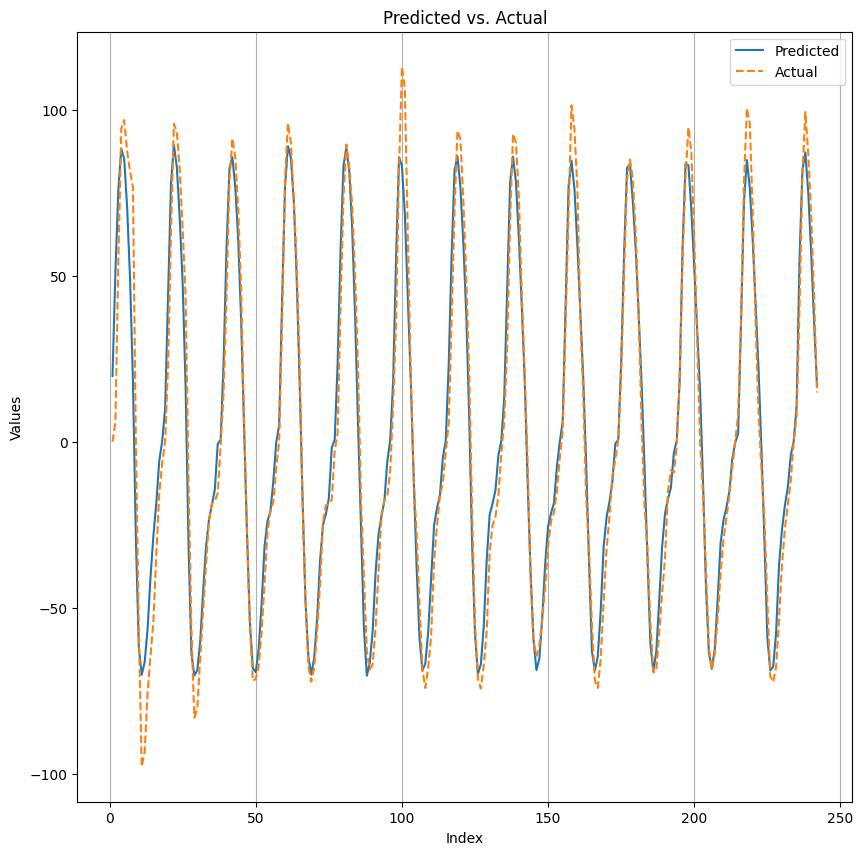

SCENE 14  TRAIN: [ 964  455 1877 ...  908 4351 2126]  TEST: [2893 2894 2895 2896 2897 2898 2899 2900 2901 2902 2903 2904 2905 2906
 2907 2908 2909 2910 2911 2912 2913 2914 2915 2916 2917 2918 2919 2920
 2921 2922 2923 2924 2925 2926 2927 2928 2929 2930 2931 2932 2933 2934
 2935 2936 2937 2938 2939 2940 2941 2942 2943 2944 2945 2946 2947 2948
 2949 2950 2951 2952 2953 2954 2955 2956 2957 2958 2959 2960 2961 2962
 2963 2964 2965 2966 2967 2968 2969 2970 2971 2972 2973 2974 2975 2976
 2977 2978 2979 2980 2981 2982 2983 2984 2985 2986 2987 2988 2989 2990
 2991 2992 2993 2994 2995 2996 2997 2998 2999 3000 3001 3002 3003 3004
 3005 3006 3007 3008 3009 3010 3011 3012 3013 3014 3015 3016 3017 3018
 3019 3020 3021 3022 3023 3024 3025 3026 3027 3028 3029 3030 3031 3032
 3033 3034 3035 3036 3037 3038 3039 3040 3041 3042 3043 3044 3045 3046
 3047 3048 3049 3050 3051 3052 3053 3054 3055 3056 3057 3058 3059 3060
 3061 3062 3063 3064 3065 3066 3067 3068 3069 3070 3071 3072 3073 3074
 3075 3076 3077 3

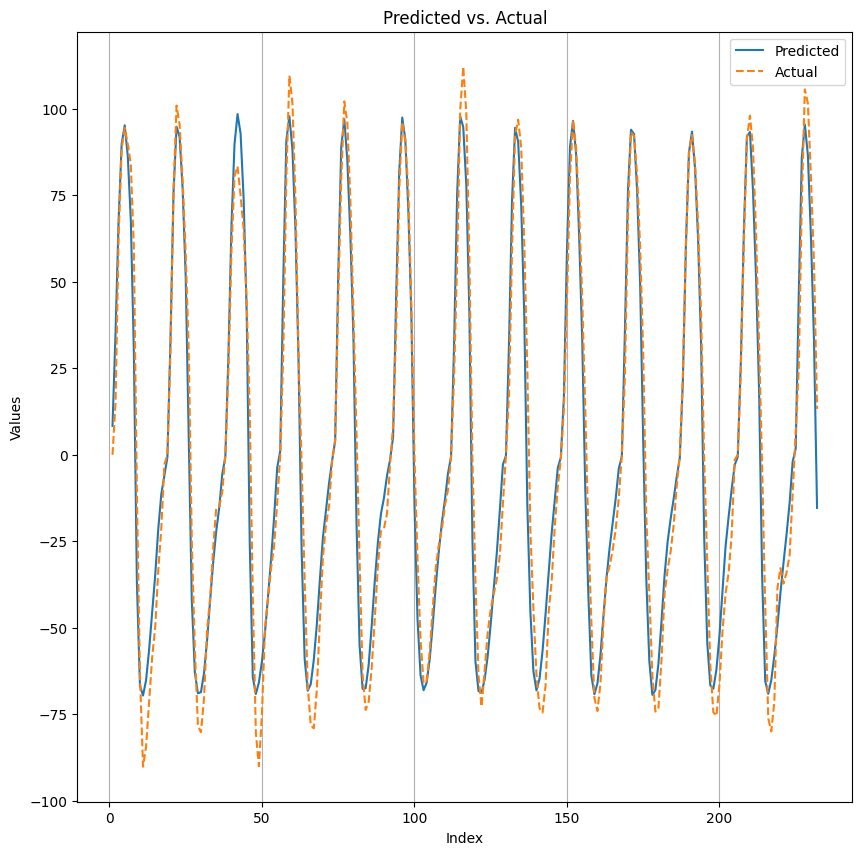

SCENE 15  TRAIN: [ 901 1862 4058 ... 2908 3424 4070]  TEST: [3125 3126 3127 3128 3129 3130 3131 3132 3133 3134 3135 3136 3137 3138
 3139 3140 3141 3142 3143 3144 3145 3146 3147 3148 3149 3150 3151 3152
 3153 3154 3155 3156 3157 3158 3159 3160 3161 3162 3163 3164 3165 3166
 3167 3168 3169 3170 3171 3172 3173 3174 3175 3176 3177 3178 3179 3180
 3181 3182 3183 3184 3185 3186 3187 3188 3189 3190 3191 3192 3193 3194
 3195 3196 3197 3198 3199 3200 3201 3202 3203 3204 3205 3206 3207 3208
 3209 3210 3211 3212 3213 3214 3215 3216 3217 3218 3219 3220 3221 3222
 3223 3224 3225 3226 3227 3228 3229 3230 3231 3232 3233 3234 3235 3236
 3237 3238 3239 3240 3241 3242 3243 3244 3245 3246 3247 3248 3249 3250
 3251 3252 3253 3254 3255 3256 3257 3258 3259 3260 3261 3262 3263 3264
 3265 3266 3267 3268 3269 3270 3271 3272 3273 3274 3275 3276 3277 3278
 3279 3280 3281 3282 3283 3284 3285 3286 3287 3288 3289 3290 3291 3292
 3293 3294 3295 3296 3297 3298 3299 3300 3301 3302 3303 3304 3305 3306
 3307 3308 3309 3

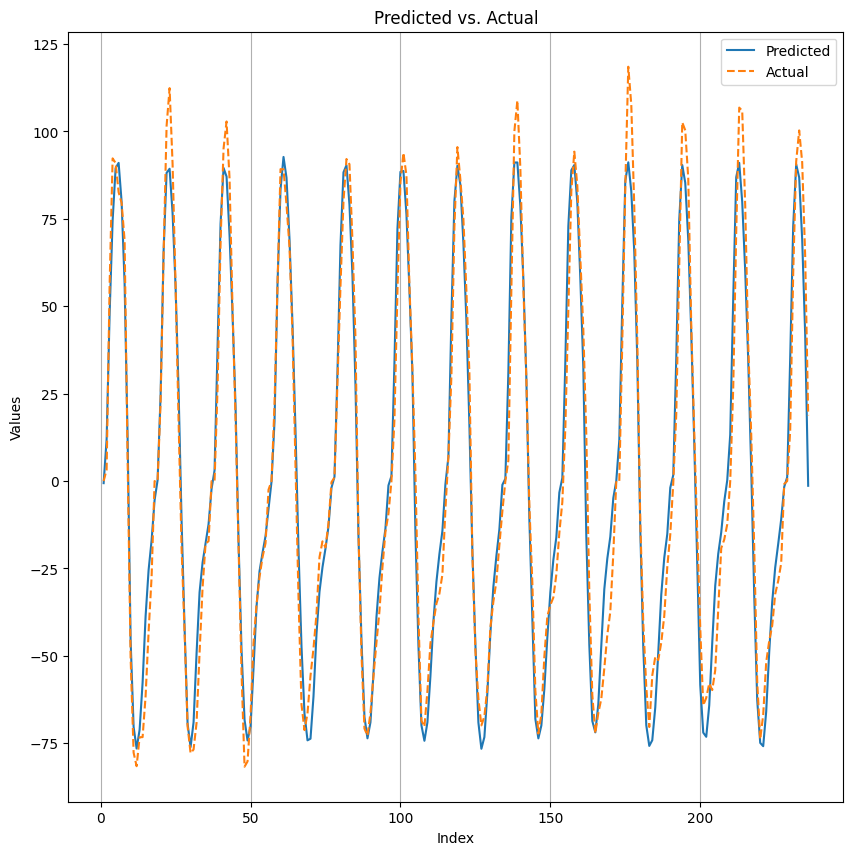

SCENE 16  TRAIN: [1838 1124 1812 ...  926 1723  975]  TEST: [3361 3362 3363 3364 3365 3366 3367 3368 3369 3370 3371 3372 3373 3374
 3375 3376 3377 3378 3379 3380 3381 3382 3383 3384 3385 3386 3387 3388
 3389 3390 3391 3392 3393 3394 3395 3396 3397 3398 3399 3400 3401 3402
 3403 3404 3405 3406 3407 3408 3409 3410 3411 3412 3413 3414 3415 3416
 3417 3418 3419 3420 3421 3422 3423 3424 3425 3426 3427 3428 3429 3430
 3431 3432 3433 3434 3435 3436 3437 3438 3439 3440 3441 3442 3443 3444
 3445 3446 3447 3448 3449 3450 3451 3452 3453 3454 3455 3456 3457 3458
 3459 3460 3461 3462 3463 3464 3465 3466 3467 3468 3469 3470 3471 3472
 3473 3474 3475 3476 3477 3478 3479 3480 3481 3482 3483 3484 3485 3486
 3487 3488 3489 3490 3491 3492 3493 3494 3495 3496 3497 3498 3499 3500
 3501 3502 3503 3504 3505 3506 3507 3508 3509 3510 3511 3512 3513 3514
 3515 3516 3517 3518 3519 3520 3521 3522 3523 3524 3525 3526 3527 3528
 3529 3530 3531 3532 3533 3534 3535 3536 3537 3538 3539 3540 3541 3542
 3543 3544 3545 3

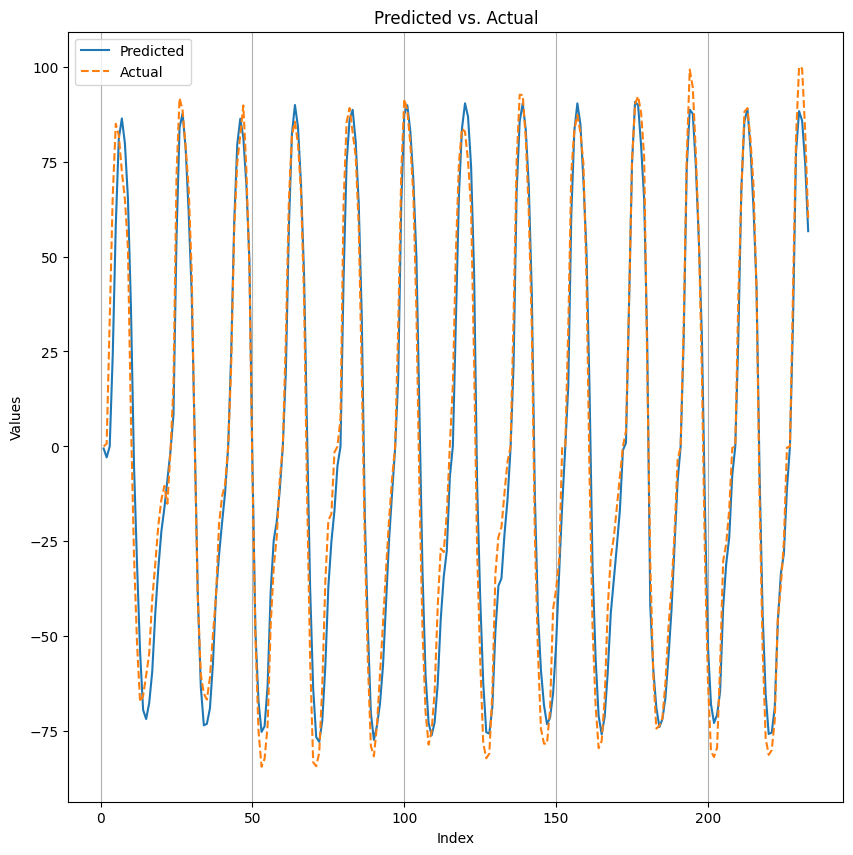

SCENE 17  TRAIN: [2425 4112 2601 ... 1520 4629 4036]  TEST: [3594 3595 3596 3597 3598 3599 3600 3601 3602 3603 3604 3605 3606 3607
 3608 3609 3610 3611 3612 3613 3614 3615 3616 3617 3618 3619 3620 3621
 3622 3623 3624 3625 3626 3627 3628 3629 3630 3631 3632 3633 3634 3635
 3636 3637 3638 3639 3640 3641 3642 3643 3644 3645 3646 3647 3648 3649
 3650 3651 3652 3653 3654 3655 3656 3657 3658 3659 3660 3661 3662 3663
 3664 3665 3666 3667 3668 3669 3670 3671 3672 3673 3674 3675 3676 3677
 3678 3679 3680 3681 3682 3683 3684 3685 3686 3687 3688 3689 3690 3691
 3692 3693 3694 3695 3696 3697 3698 3699 3700 3701 3702 3703 3704 3705
 3706 3707 3708 3709 3710 3711 3712 3713 3714 3715 3716 3717 3718 3719
 3720 3721 3722 3723 3724 3725 3726 3727 3728 3729 3730 3731 3732 3733
 3734 3735 3736 3737 3738 3739 3740 3741 3742 3743 3744 3745 3746 3747
 3748 3749 3750 3751 3752 3753 3754 3755 3756 3757 3758 3759 3760 3761
 3762 3763 3764 3765 3766 3767 3768 3769 3770 3771 3772 3773 3774 3775
 3776 3777 3778 3

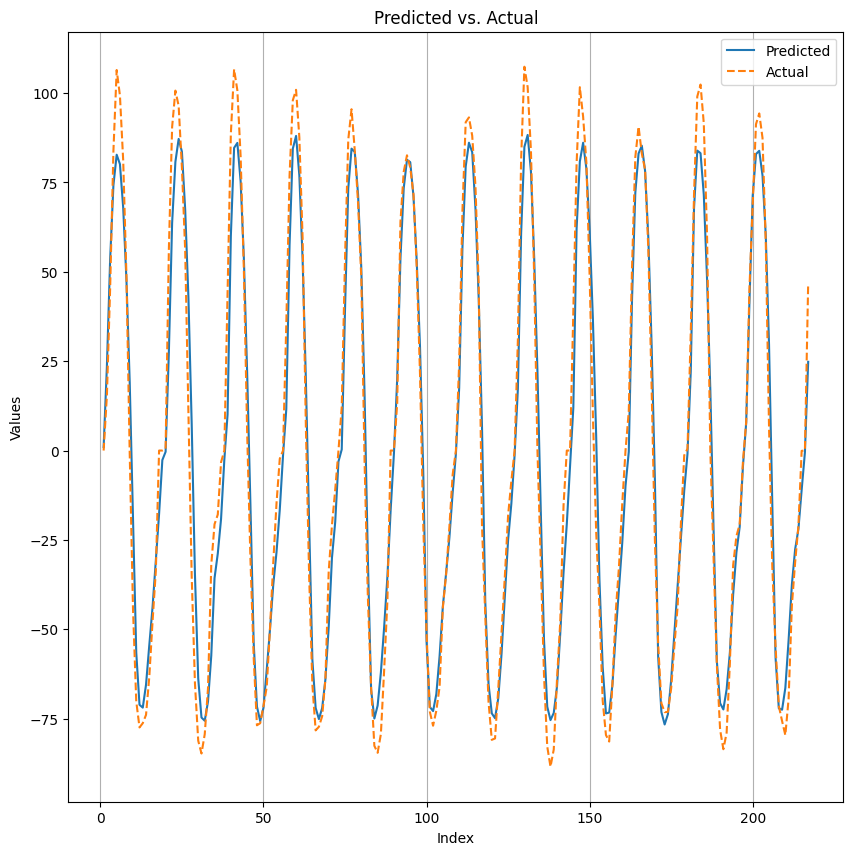

SCENE 18  TRAIN: [2117  194 1338 ... 1316 4590  245]  TEST: [3811 3812 3813 3814 3815 3816 3817 3818 3819 3820 3821 3822 3823 3824
 3825 3826 3827 3828 3829 3830 3831 3832 3833 3834 3835 3836 3837 3838
 3839 3840 3841 3842 3843 3844 3845 3846 3847 3848 3849 3850 3851 3852
 3853 3854 3855 3856 3857 3858 3859 3860 3861 3862 3863 3864 3865 3866
 3867 3868 3869 3870 3871 3872 3873 3874 3875 3876 3877 3878 3879 3880
 3881 3882 3883 3884 3885 3886 3887 3888 3889 3890 3891 3892 3893 3894
 3895 3896 3897 3898 3899 3900 3901 3902 3903 3904 3905 3906 3907 3908
 3909 3910 3911 3912 3913 3914 3915 3916 3917 3918 3919 3920 3921 3922
 3923 3924 3925 3926 3927 3928 3929 3930 3931 3932 3933 3934 3935 3936
 3937 3938 3939 3940 3941 3942 3943 3944 3945 3946 3947 3948 3949 3950
 3951 3952 3953 3954 3955 3956 3957 3958 3959 3960 3961 3962 3963 3964
 3965 3966 3967 3968 3969 3970 3971 3972 3973 3974 3975 3976 3977 3978
 3979 3980 3981 3982 3983 3984 3985 3986 3987 3988 3989 3990 3991 3992
 3993 3994 3995 3

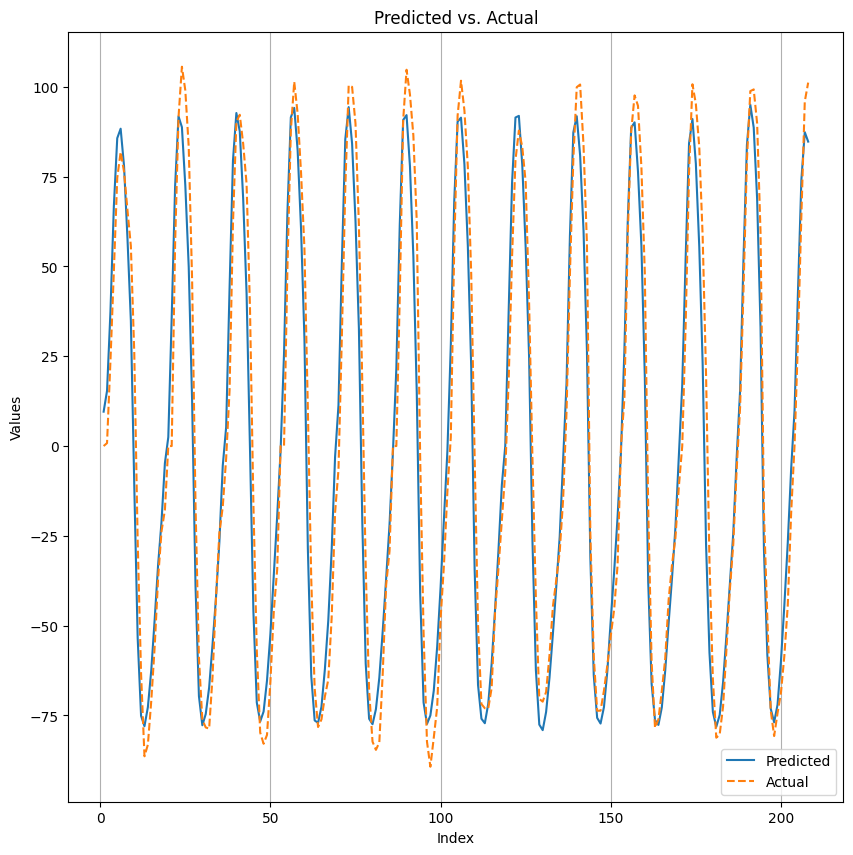

SCENE 19  TRAIN: [ 130  778 1265 ... 1540 2398 3303]  TEST: [4019 4020 4021 4022 4023 4024 4025 4026 4027 4028 4029 4030 4031 4032
 4033 4034 4035 4036 4037 4038 4039 4040 4041 4042 4043 4044 4045 4046
 4047 4048 4049 4050 4051 4052 4053 4054 4055 4056 4057 4058 4059 4060
 4061 4062 4063 4064 4065 4066 4067 4068 4069 4070 4071 4072 4073 4074
 4075 4076 4077 4078 4079 4080 4081 4082 4083 4084 4085 4086 4087 4088
 4089 4090 4091 4092 4093 4094 4095 4096 4097 4098 4099 4100 4101 4102
 4103 4104 4105 4106 4107 4108 4109 4110 4111 4112 4113 4114 4115 4116
 4117 4118 4119 4120 4121 4122 4123 4124 4125 4126 4127 4128 4129 4130
 4131 4132 4133 4134 4135 4136 4137 4138 4139 4140 4141 4142 4143 4144
 4145 4146 4147 4148 4149 4150 4151 4152 4153 4154 4155 4156 4157 4158
 4159 4160 4161 4162 4163 4164 4165 4166 4167 4168 4169 4170 4171 4172
 4173 4174 4175 4176 4177 4178 4179 4180 4181 4182 4183 4184 4185 4186
 4187 4188 4189 4190 4191 4192 4193 4194 4195 4196 4197 4198 4199 4200
 4201 4202 4203 4

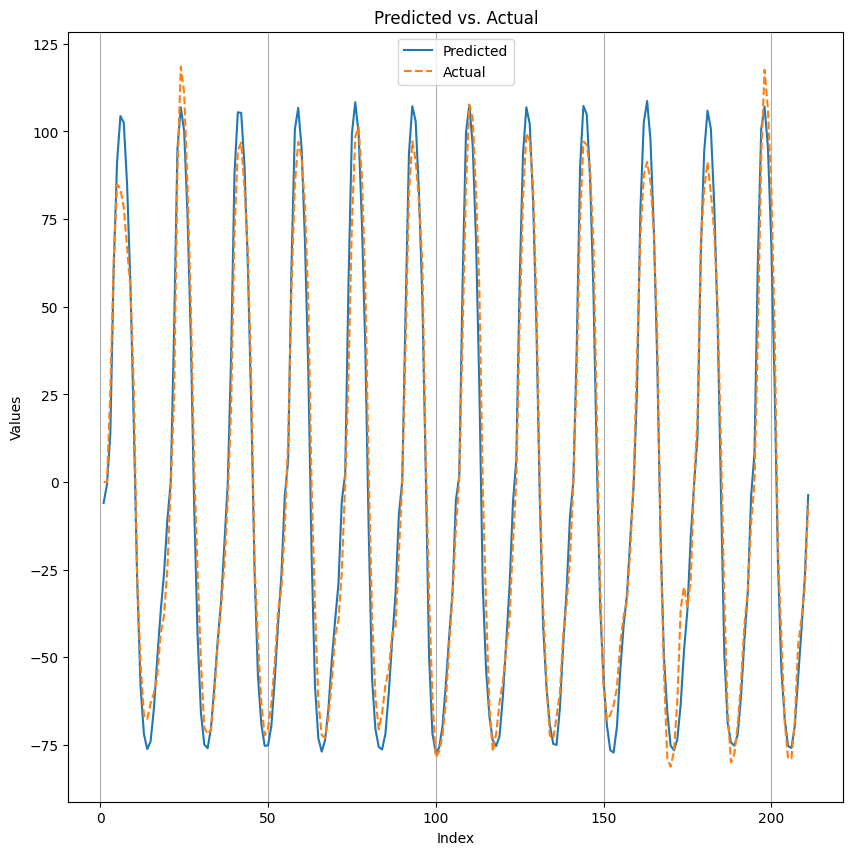

SCENE 20  TRAIN: [1860 1831   82 ... 3811 2749 2938]  TEST: [4230 4231 4232 4233 4234 4235 4236 4237 4238 4239 4240 4241 4242 4243
 4244 4245 4246 4247 4248 4249 4250 4251 4252 4253 4254 4255 4256 4257
 4258 4259 4260 4261 4262 4263 4264 4265 4266 4267 4268 4269 4270 4271
 4272 4273 4274 4275 4276 4277 4278 4279 4280 4281 4282 4283 4284 4285
 4286 4287 4288 4289 4290 4291 4292 4293 4294 4295 4296 4297 4298 4299
 4300 4301 4302 4303 4304 4305 4306 4307 4308 4309 4310 4311 4312 4313
 4314 4315 4316 4317 4318 4319 4320 4321 4322 4323 4324 4325 4326 4327
 4328 4329 4330 4331 4332 4333 4334 4335 4336 4337 4338 4339 4340 4341
 4342 4343 4344 4345 4346 4347 4348 4349 4350 4351 4352 4353 4354 4355
 4356 4357 4358 4359 4360 4361 4362 4363 4364 4365 4366 4367 4368 4369]
Epoch 1/30
287/287 [==============================] - 14s 20ms/step - loss: 0.1392 - val_loss: 0.1565
Epoch 2/30
287/287 [==============================] - 4s 14ms/step - loss: 0.1363 - val_loss: 0.1803
Epoch 3/30
287/287 [======

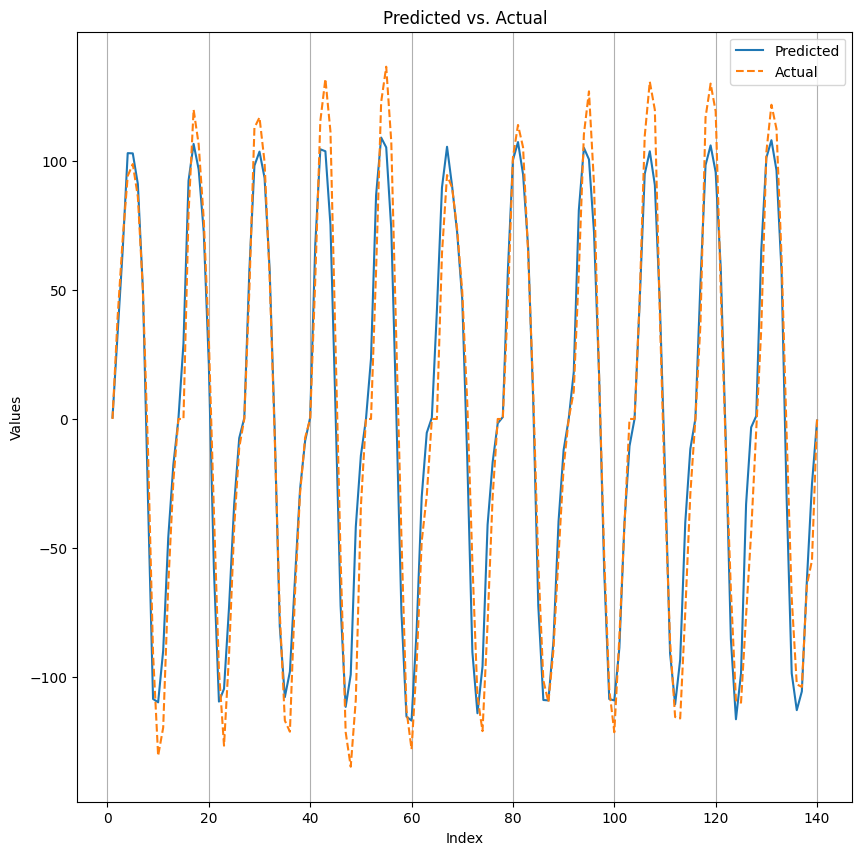

SCENE 21  TRAIN: [ 106  380 3136 ... 1532 3388  861]  TEST: [4370 4371 4372 4373 4374 4375 4376 4377 4378 4379 4380 4381 4382 4383
 4384 4385 4386 4387 4388 4389 4390 4391 4392 4393 4394 4395 4396 4397
 4398 4399 4400 4401 4402 4403 4404 4405 4406 4407 4408 4409 4410 4411
 4412 4413 4414 4415 4416 4417 4418 4419 4420 4421 4422 4423 4424 4425
 4426 4427 4428 4429 4430 4431 4432 4433 4434 4435 4436 4437 4438 4439
 4440 4441 4442 4443 4444 4445 4446 4447 4448 4449 4450 4451 4452 4453
 4454 4455 4456 4457 4458 4459 4460 4461 4462 4463 4464 4465 4466 4467
 4468 4469 4470 4471 4472 4473 4474 4475 4476 4477 4478 4479 4480 4481
 4482 4483 4484 4485 4486 4487 4488 4489]
Epoch 1/30
288/288 [==============================] - 12s 18ms/step - loss: 0.1449 - val_loss: 0.2815
Epoch 2/30
288/288 [==============================] - 4s 14ms/step - loss: 0.0823 - val_loss: 0.1338
Epoch 3/30
288/288 [==============================] - 4s 15ms/step - loss: 0.0601 - val_loss: 0.1242
Epoch 4/30
288/288 [======

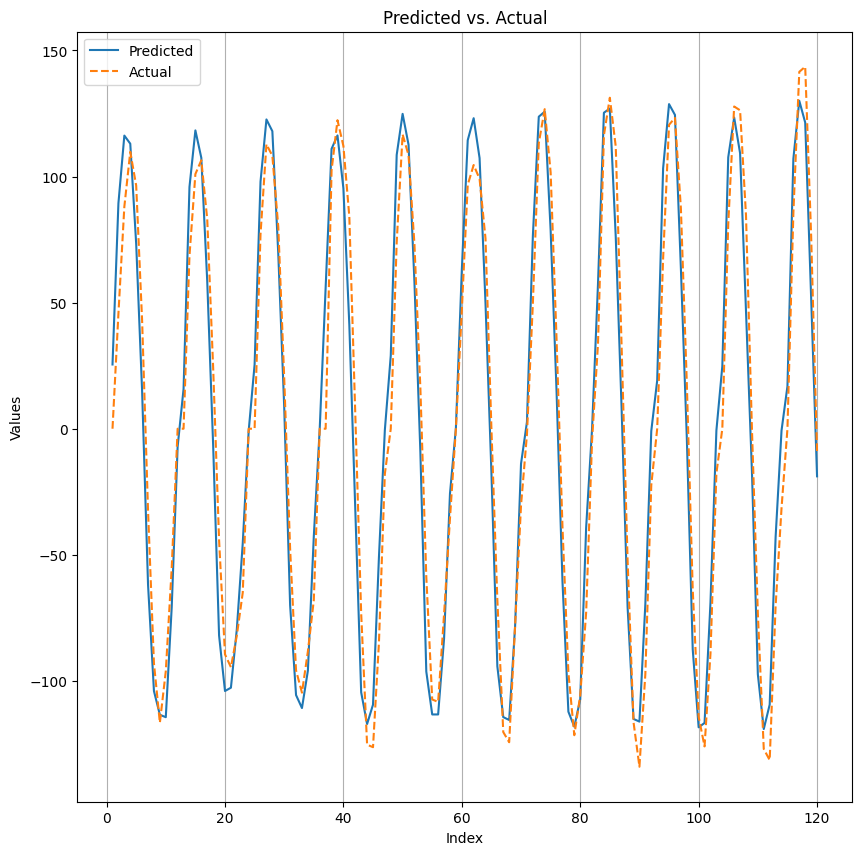

SCENE 22  TRAIN: [3995 4237 2273 ... 3710 1922 1754]  TEST: [4490 4491 4492 4493 4494 4495 4496 4497 4498 4499 4500 4501 4502 4503
 4504 4505 4506 4507 4508 4509 4510 4511 4512 4513 4514 4515 4516 4517
 4518 4519 4520 4521 4522 4523 4524 4525 4526 4527 4528 4529 4530 4531
 4532 4533 4534 4535 4536 4537 4538 4539 4540 4541 4542 4543 4544 4545
 4546 4547 4548 4549 4550 4551 4552 4553 4554 4555 4556 4557 4558 4559
 4560 4561 4562 4563 4564 4565 4566 4567 4568 4569 4570 4571 4572 4573
 4574 4575 4576 4577 4578 4579 4580 4581 4582 4583 4584 4585 4586 4587
 4588 4589 4590 4591 4592 4593 4594 4595 4596 4597 4598 4599 4600 4601
 4602 4603 4604 4605 4606 4607 4608]
Epoch 1/30
288/288 [==============================] - 12s 17ms/step - loss: 0.1371 - val_loss: 0.2776
Epoch 2/30
288/288 [==============================] - 4s 15ms/step - loss: 0.0841 - val_loss: 0.1410
Epoch 3/30
288/288 [==============================] - 4s 14ms/step - loss: 0.0633 - val_loss: 0.1424
Epoch 4/30
288/288 [===========

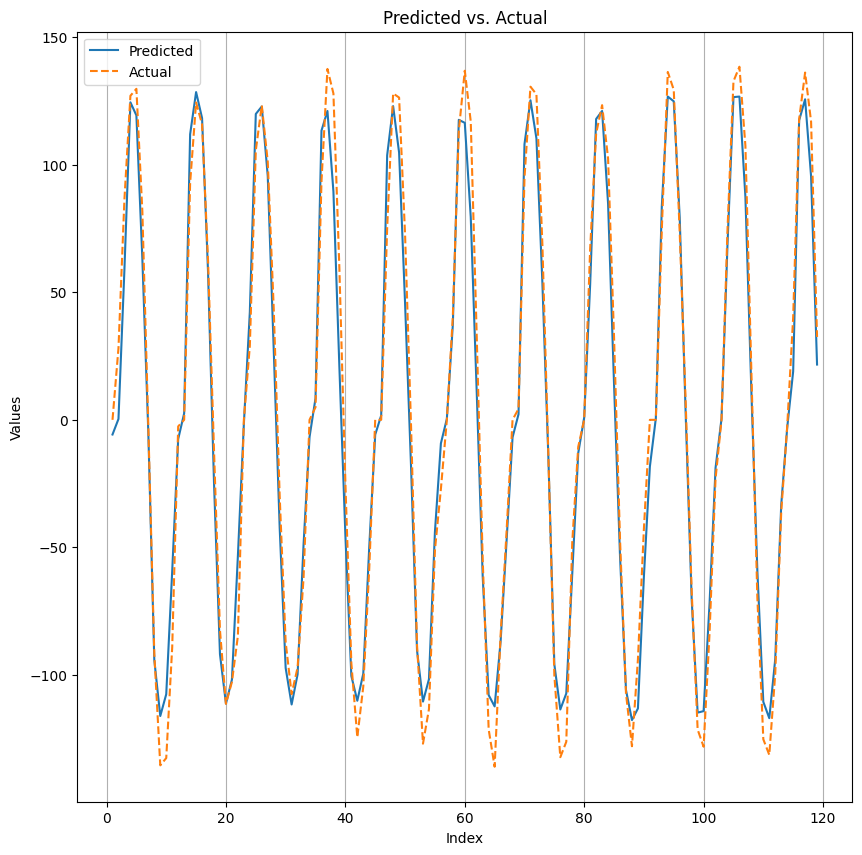

SCENE 23  TRAIN: [3084 1211  956 ... 3121 4151 3983]  TEST: [4609 4610 4611 4612 4613 4614 4615 4616 4617 4618 4619 4620 4621 4622
 4623 4624 4625 4626 4627 4628 4629 4630 4631 4632 4633 4634 4635 4636
 4637 4638 4639 4640 4641 4642 4643 4644 4645 4646 4647 4648 4649 4650
 4651 4652 4653 4654 4655 4656 4657 4658 4659 4660 4661 4662 4663 4664
 4665 4666 4667 4668 4669 4670 4671 4672 4673 4674 4675 4676 4677 4678
 4679 4680 4681 4682 4683 4684 4685 4686 4687 4688 4689 4690 4691 4692
 4693 4694 4695 4696 4697 4698 4699 4700 4701 4702 4703 4704 4705 4706
 4707 4708 4709 4710 4711 4712 4713 4714 4715 4716 4717 4718 4719 4720
 4721]
Epoch 1/30
289/289 [==============================] - 12s 18ms/step - loss: 0.1445 - val_loss: 0.3330
Epoch 2/30
289/289 [==============================] - 5s 16ms/step - loss: 0.0964 - val_loss: 0.1742
Epoch 3/30
289/289 [==============================] - 4s 14ms/step - loss: 0.0780 - val_loss: 0.1419
Epoch 4/30
289/289 [==============================] - 4s 14ms

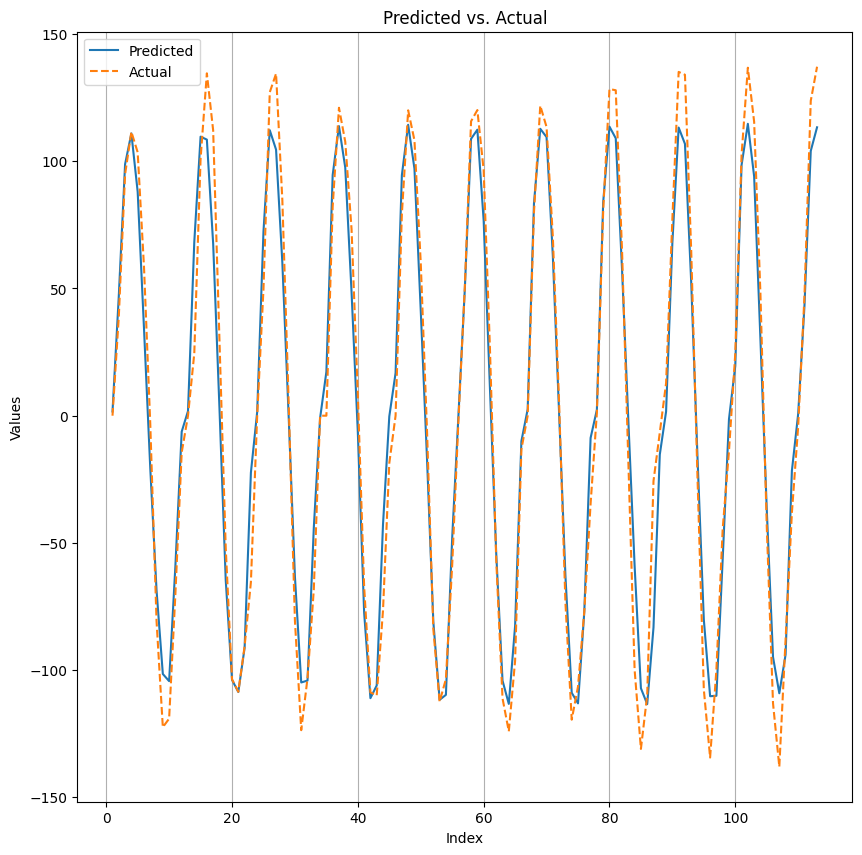

In [18]:
ResultadosRegressao(Resultados4Matrix[0],Resultados4Matrix[1],Resultados4Matrix[5])